# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [3]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [4]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [5]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [6]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [9]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [10]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [15]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - torch.ones_like(gradient_norm))**2)
    #### END CODE HERE ####
    return penalty

In [16]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [17]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [18]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [43]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = -torch.mean(crit_real_pred) + torch.mean(crit_fake_pred) + c_lambda*gp
#     print(crit_loss)
    #### END CODE HERE ####
    return crit_loss

In [44]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.11585529554635286, critic loss: 1.9669069374799732


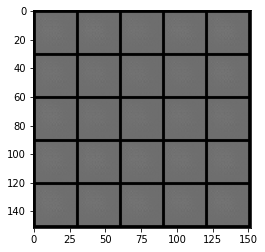

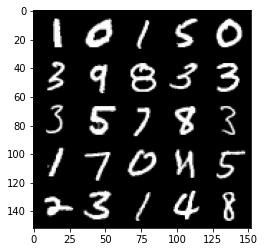

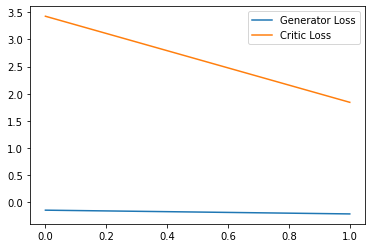

Step 100: Generator loss: 0.5926690161973238, critic loss: -1.4344550643861294


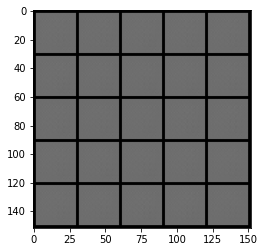

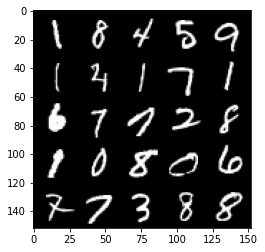

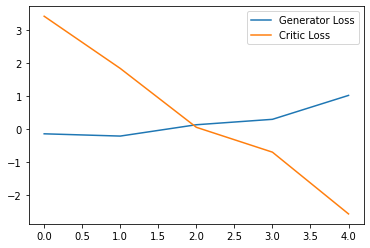

Step 150: Generator loss: 2.5859631586074827, critic loss: -10.723533077239992


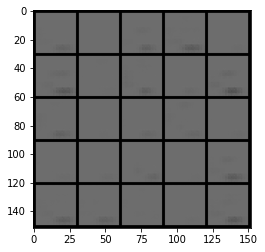

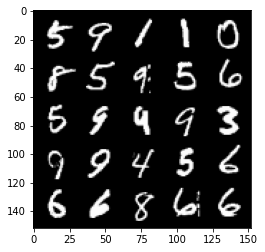

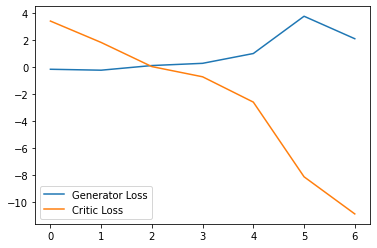

Step 200: Generator loss: 0.33625103428959846, critic loss: -26.976731346130368


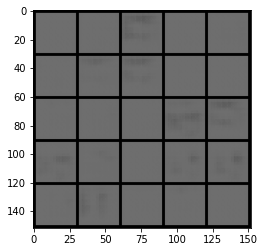

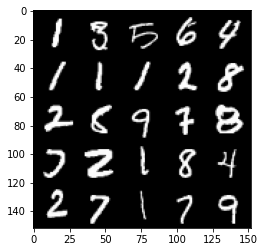

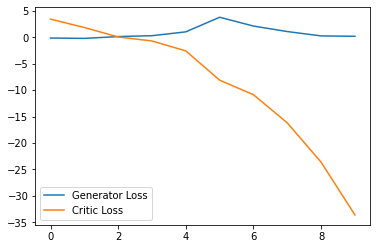

Step 250: Generator loss: -1.489758906364441, critic loss: -57.0969720916748


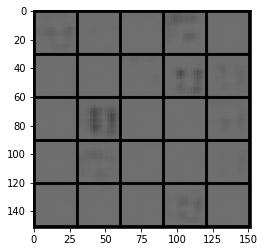

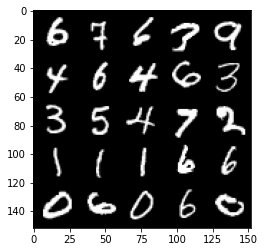

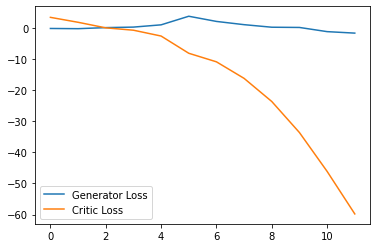

Step 300: Generator loss: -0.3349944047629833, critic loss: -99.24273141479493


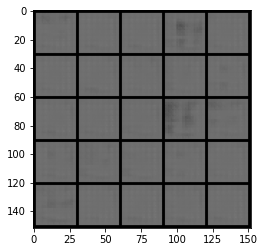

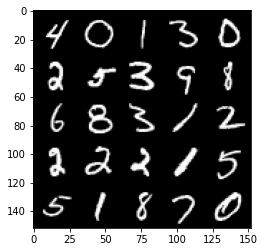

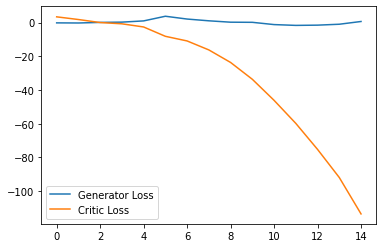

Step 350: Generator loss: 0.8648549899458885, critic loss: -146.32046459960938


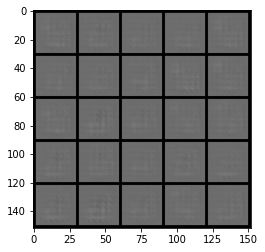

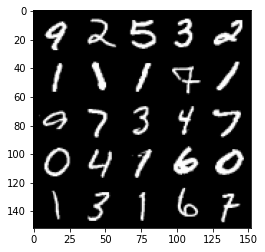

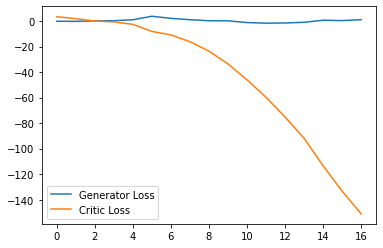

Step 400: Generator loss: 4.084740700721741, critic loss: -200.10345007324224


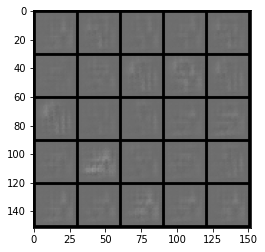

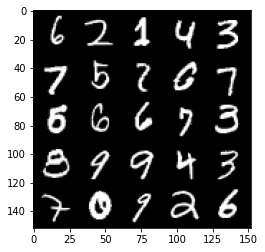

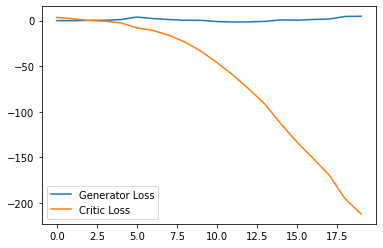

Step 450: Generator loss: 6.3552676820755005, critic loss: -241.8369292602538


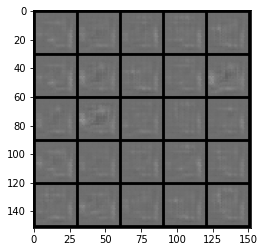

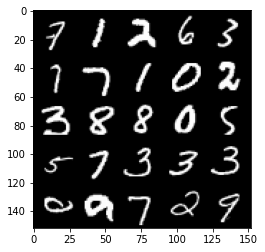

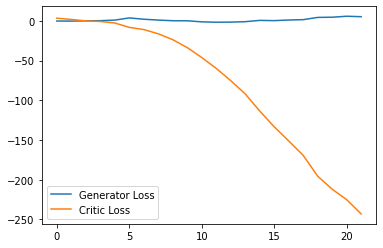

Step 500: Generator loss: 9.47320466041565, critic loss: -303.05735308837893


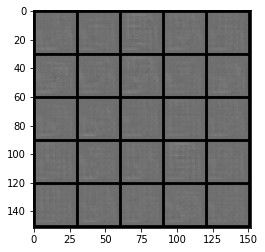

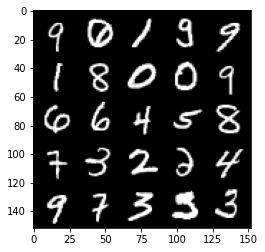

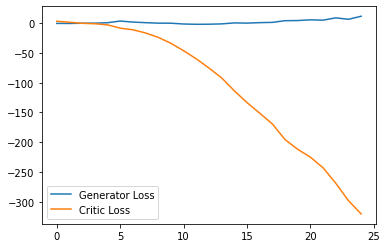

Step 550: Generator loss: 13.721243190765382, critic loss: -363.12945050048825


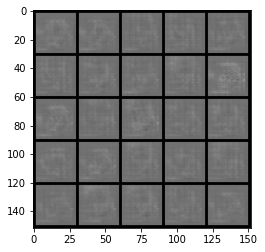

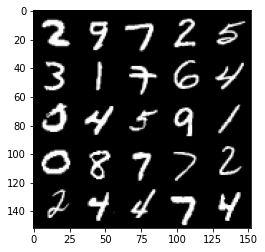

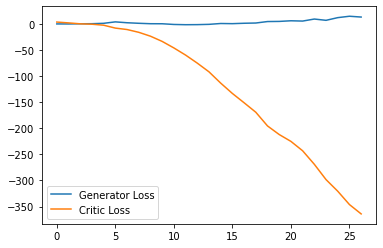

Step 600: Generator loss: 14.771503791809081, critic loss: -417.33837298583995


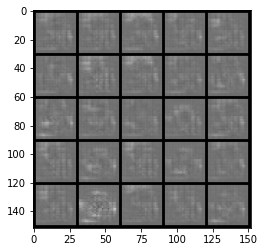

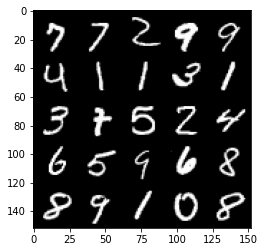

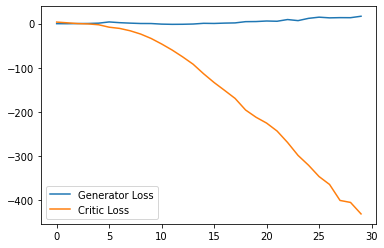

Step 650: Generator loss: 13.751924834251405, critic loss: -462.09290606689456


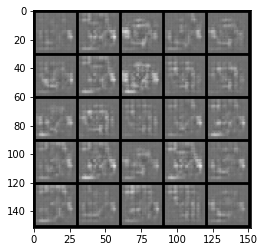

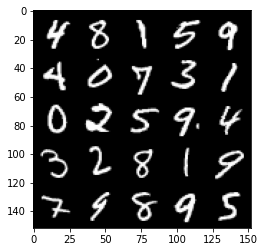

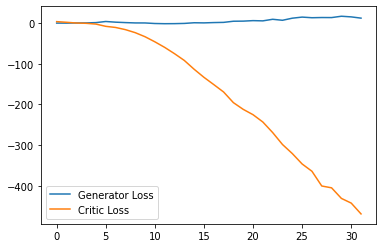

Step 700: Generator loss: 6.244444503784179, critic loss: -498.4206318664551


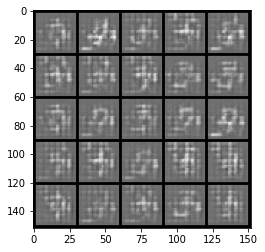

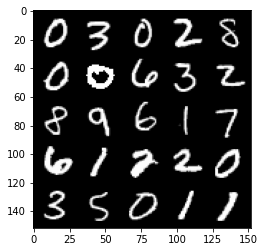

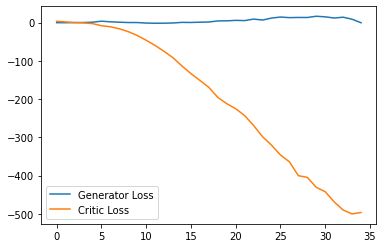

Step 750: Generator loss: -13.369961327910424, critic loss: -425.3955357055664


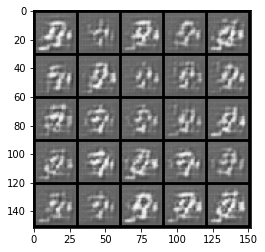

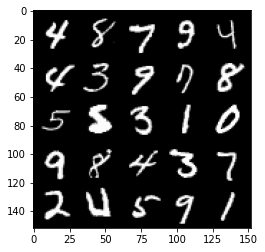

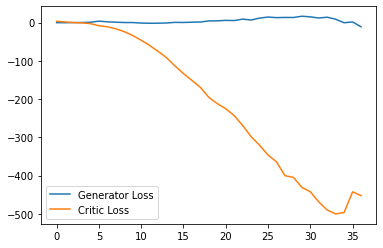

Step 800: Generator loss: -41.36425302505493, critic loss: -318.3541819763183


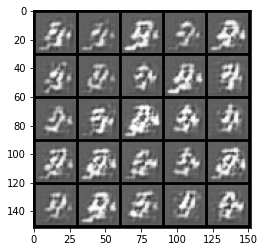

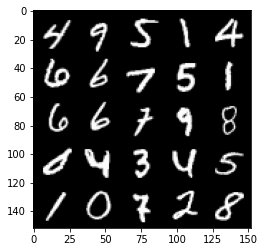

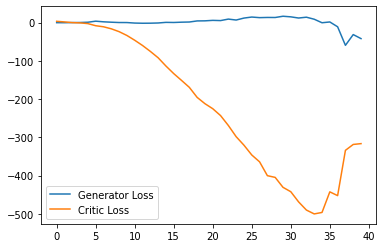

Step 850: Generator loss: 10.681666831970215, critic loss: -300.5115900268555


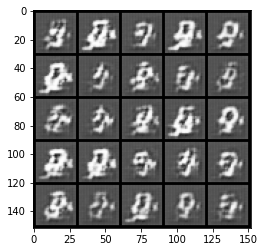

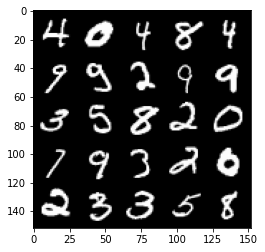

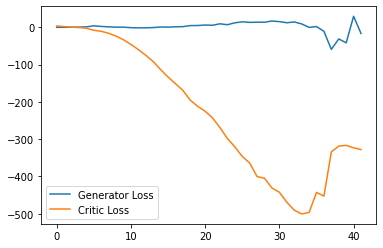

Step 900: Generator loss: -7.2903132510185245, critic loss: -204.83171485900883


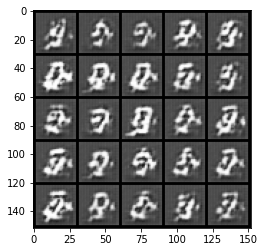

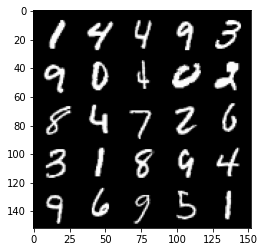

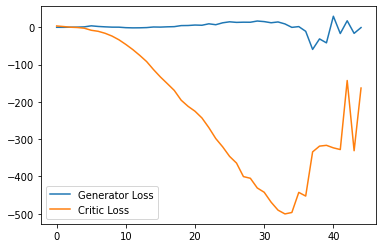

Step 950: Generator loss: -8.376663772463798, critic loss: -118.35134484100341


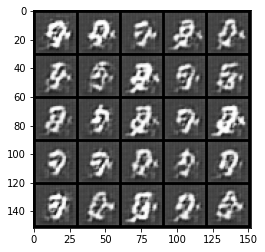

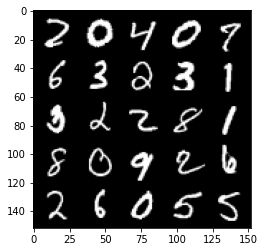

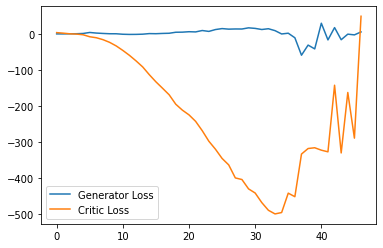

Step 1000: Generator loss: -57.06248162269592, critic loss: -184.84816259765623


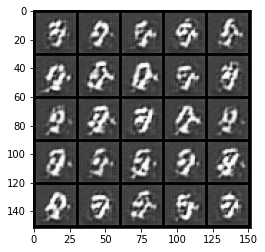

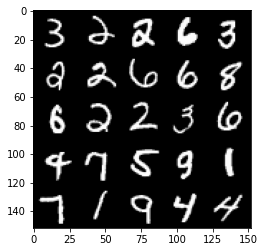

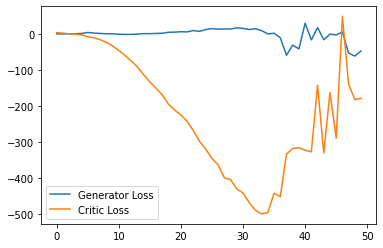

Step 1050: Generator loss: -16.477693920135497, critic loss: -169.18153610229484


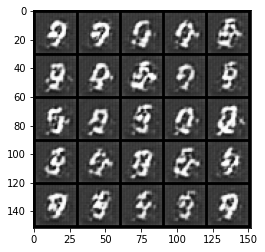

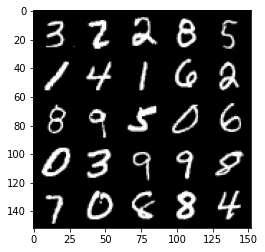

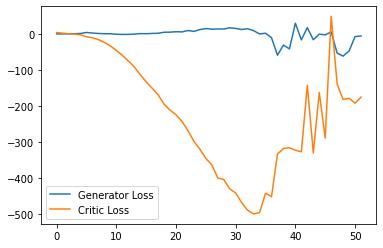

Step 1100: Generator loss: -6.900859098434449, critic loss: -82.47008516311644


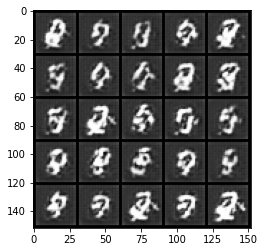

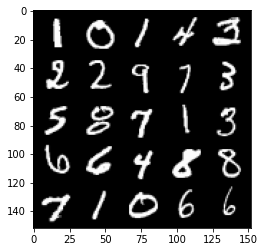

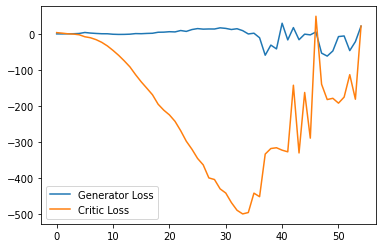

Step 1150: Generator loss: 11.223225288391113, critic loss: 23.668165332794192


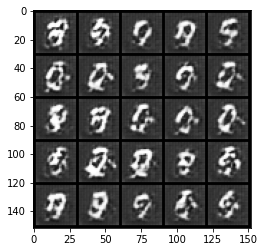

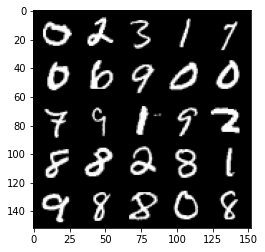

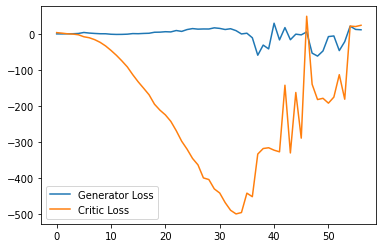

Step 1200: Generator loss: 9.620519332885742, critic loss: 25.257230857849116


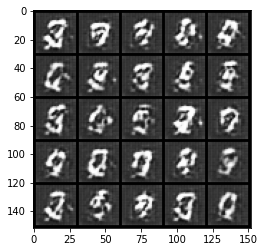

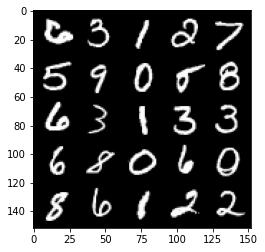

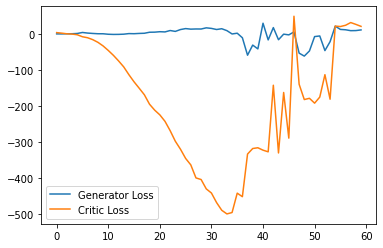

Step 1250: Generator loss: 8.21167269706726, critic loss: 21.31849422454833


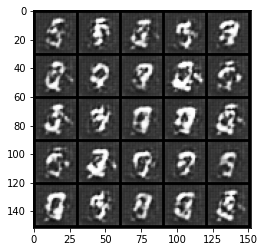

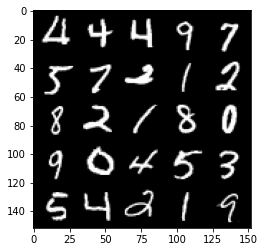

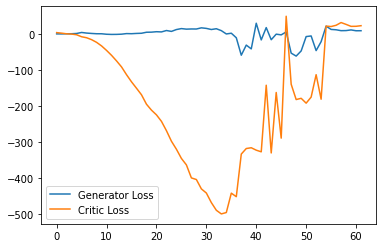

Step 1300: Generator loss: 1.2094036912918091, critic loss: 9.810228263854983


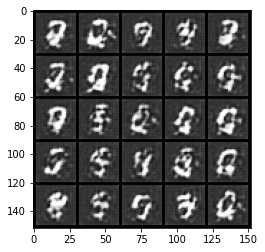

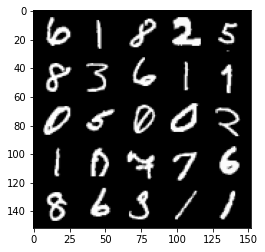

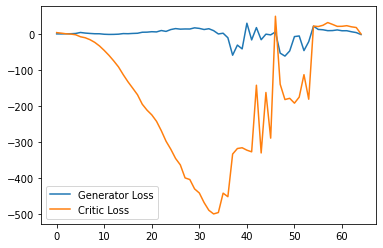

Step 1350: Generator loss: -10.357413618564605, critic loss: -34.415964187622066


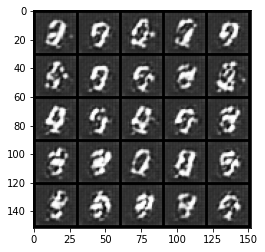

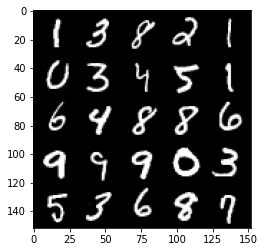

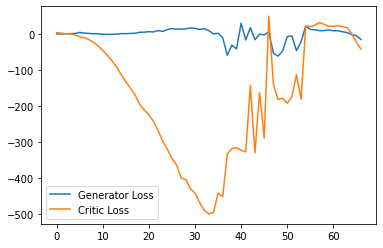

Step 1400: Generator loss: -16.490090615153314, critic loss: -51.47153295898438


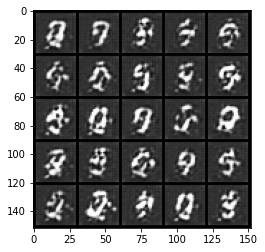

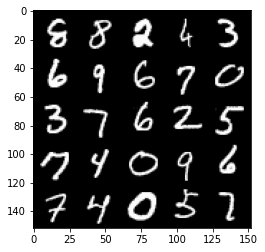

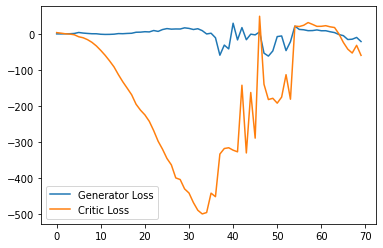

Step 1450: Generator loss: -16.00602467894554, critic loss: -72.53397972869872


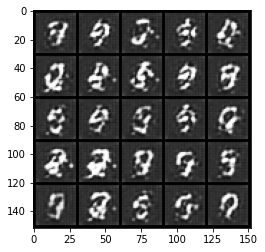

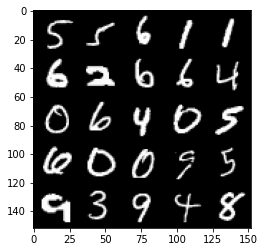

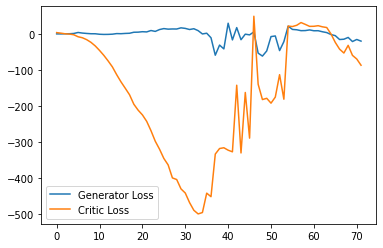

Step 1500: Generator loss: -18.481681265830993, critic loss: -52.49748083496093


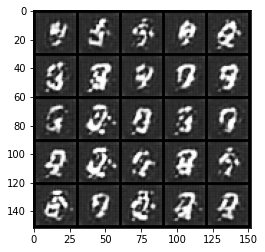

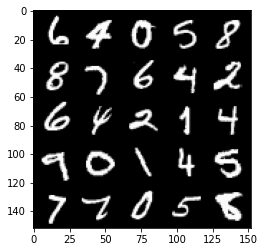

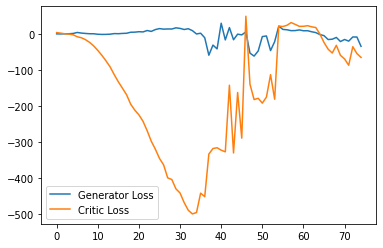

Step 1550: Generator loss: 7.599055509567261, critic loss: 1.7326921424865764


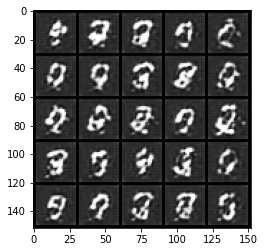

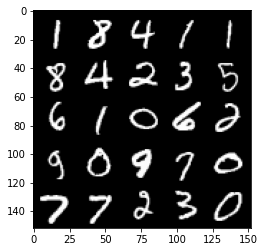

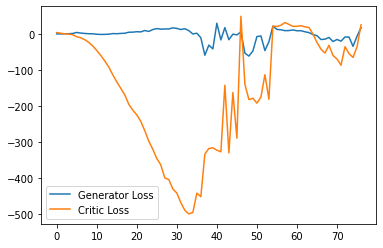

Step 1600: Generator loss: 18.887758445739745, critic loss: 33.80487361145021


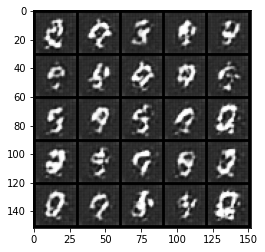

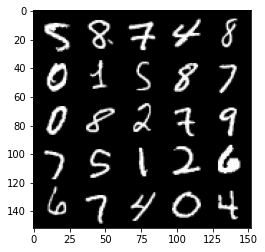

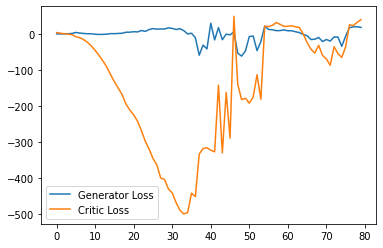

Step 1650: Generator loss: 14.363882751464844, critic loss: 44.66893988800048


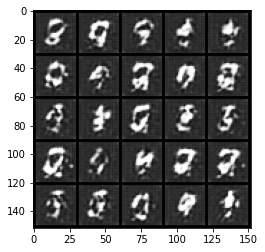

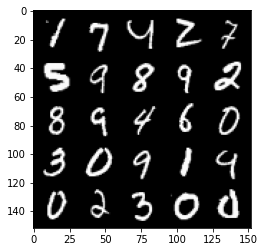

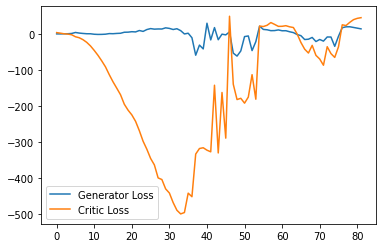

Step 1700: Generator loss: 11.779456558227539, critic loss: 47.2774560470581


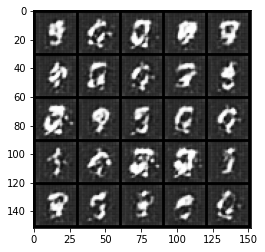

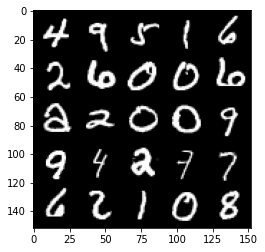

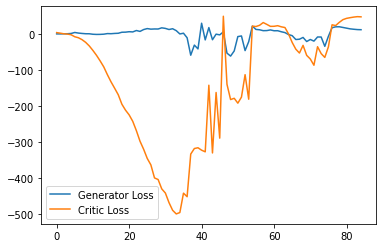

Step 1750: Generator loss: 10.374508457183838, critic loss: 44.263834899902356


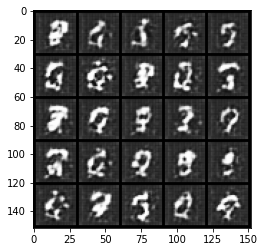

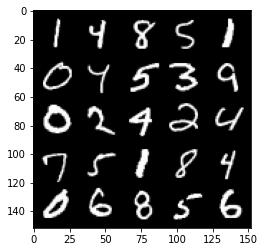

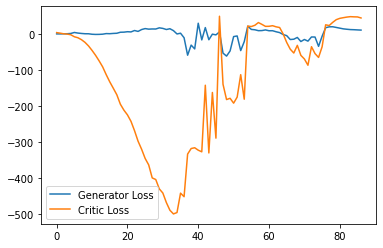

Step 1800: Generator loss: 7.228688430786133, critic loss: 35.23305661010741


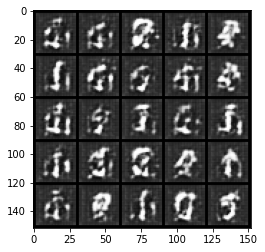

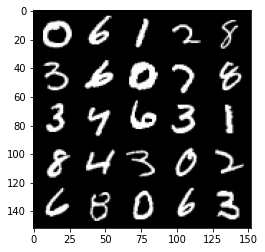

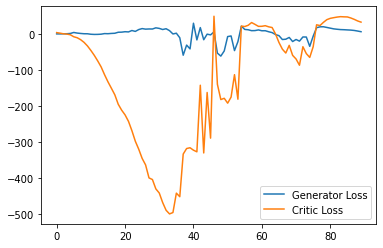

Step 1850: Generator loss: 2.7663645458221438, critic loss: 27.155615325927734


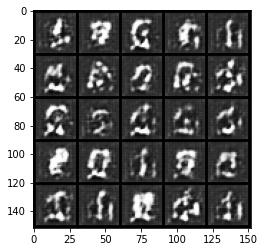

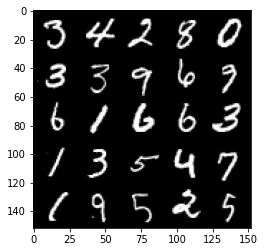

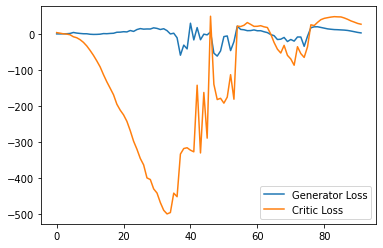

Step 1900: Generator loss: -2.3197759932279585, critic loss: 24.027419292449952


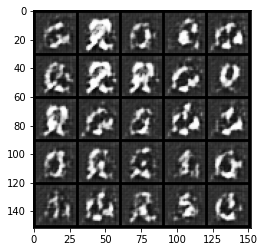

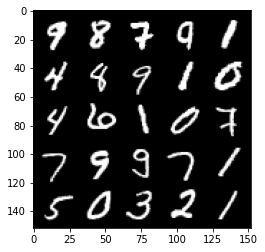

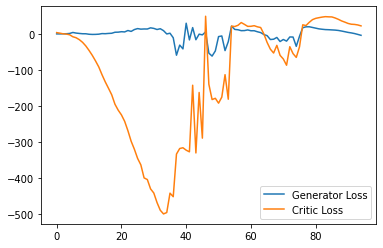

Step 1950: Generator loss: -8.244930276870727, critic loss: 16.37603392791748


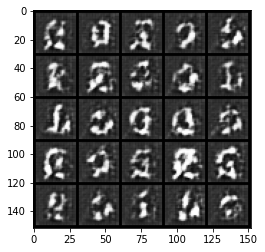

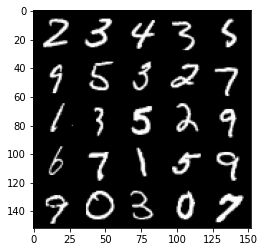

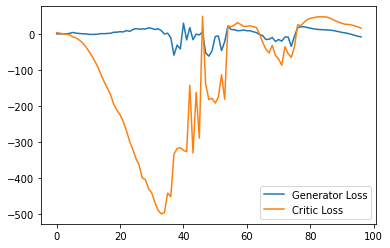

Step 2000: Generator loss: -11.339536037445068, critic loss: 8.161169788360594


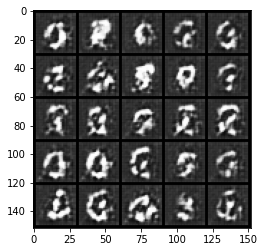

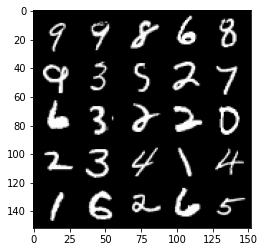

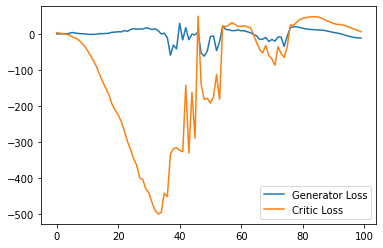

Step 2050: Generator loss: -11.689850730895996, critic loss: 2.5463763961792


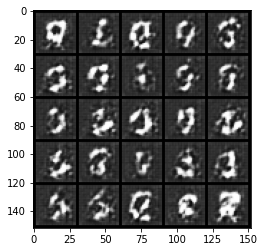

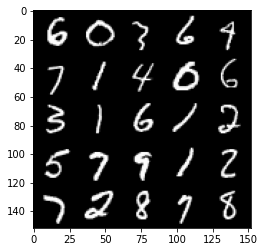

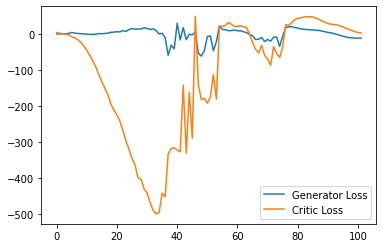

Step 2100: Generator loss: -11.868993244171143, critic loss: -0.9451669082641599


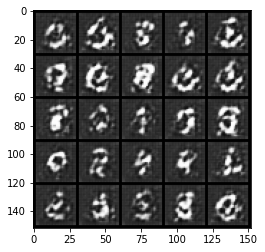

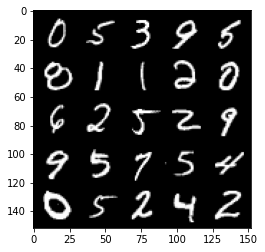

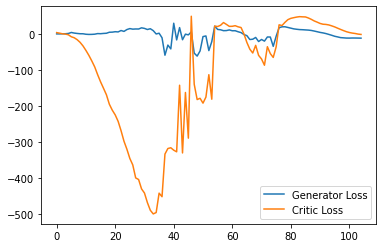

Step 2150: Generator loss: -12.590922508239746, critic loss: -2.8552111778259275


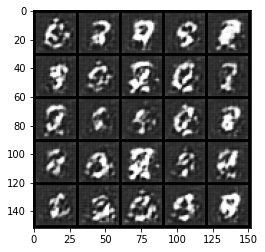

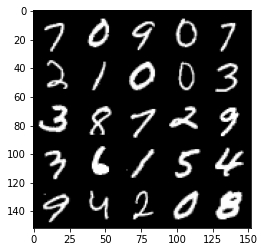

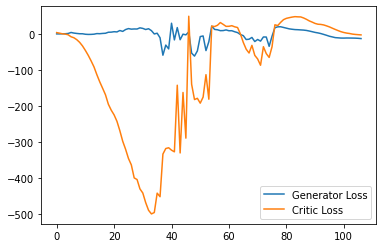

Step 2200: Generator loss: -13.940573959350585, critic loss: -4.257188210487366


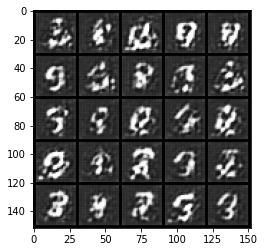

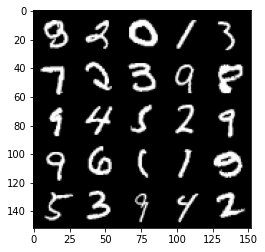

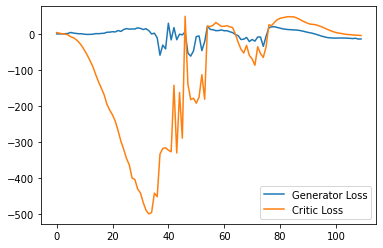

Step 2250: Generator loss: -14.998829307556152, critic loss: -5.346760284423827


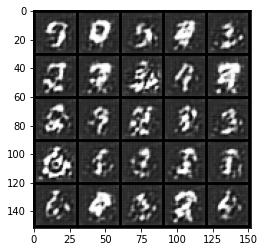

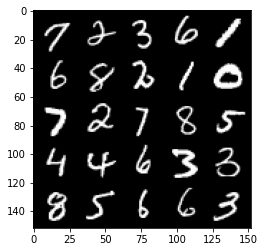

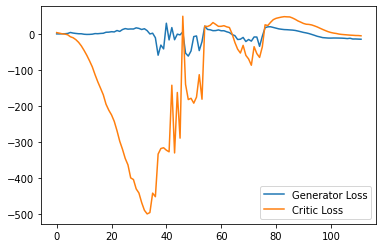

Step 2300: Generator loss: -15.762506942749024, critic loss: -7.765134733200073


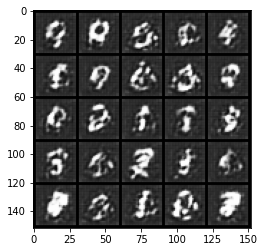

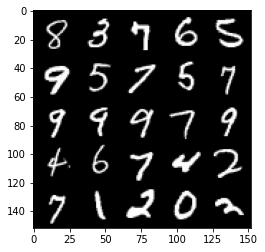

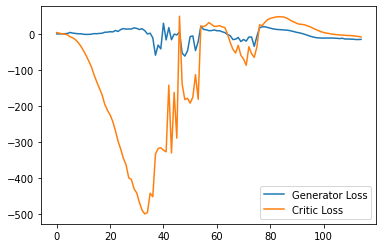

Step 2350: Generator loss: -16.83342848777771, critic loss: -11.677962520599365


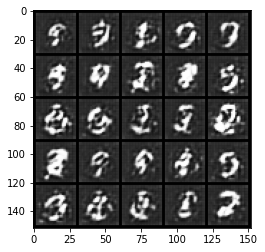

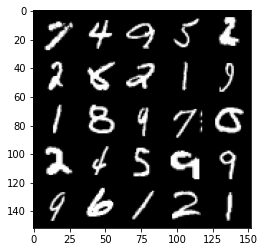

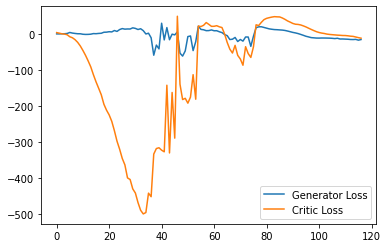

Step 2400: Generator loss: -16.28688762664795, critic loss: -14.533151020050054


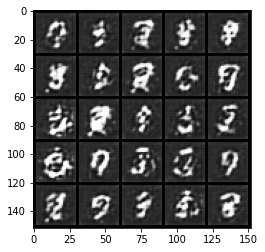

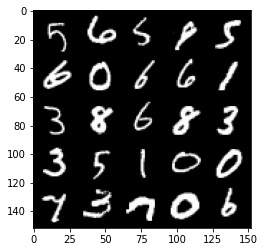

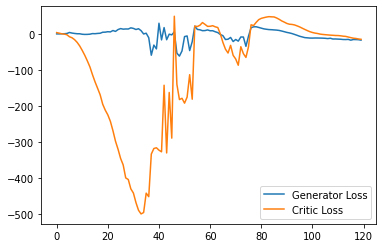

Step 2450: Generator loss: -17.641928787231446, critic loss: -16.19887728118896


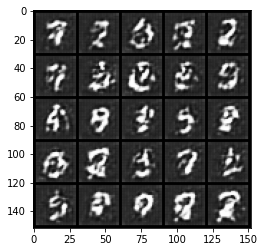

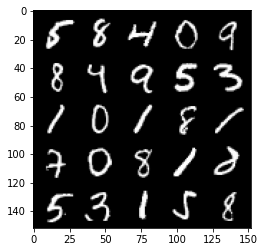

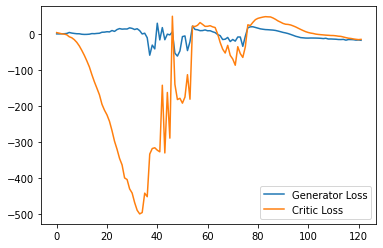

Step 2500: Generator loss: -16.372975597381593, critic loss: -18.552808963775632


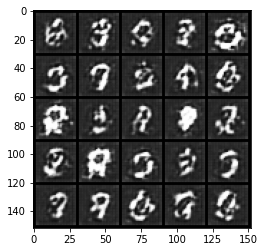

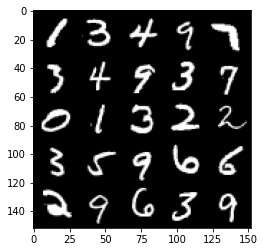

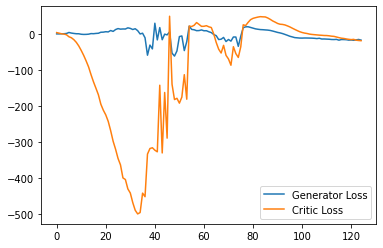

Step 2550: Generator loss: -18.999519252777098, critic loss: -19.248363147735596


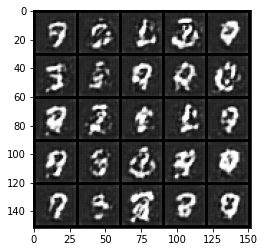

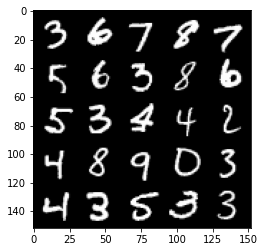

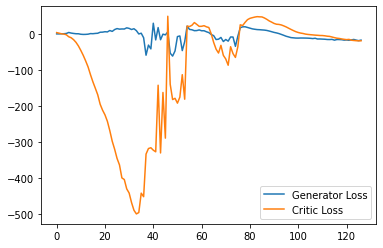

Step 2600: Generator loss: -16.95847405433655, critic loss: -20.161922479629517


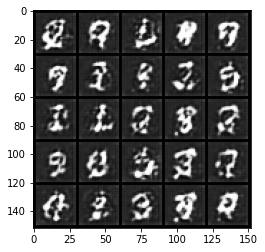

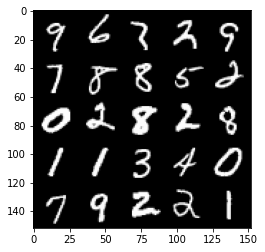

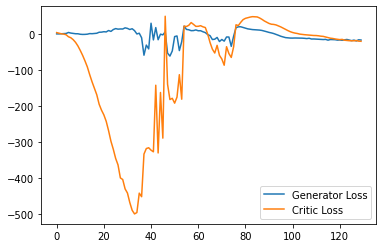

Step 2650: Generator loss: -18.80980504989624, critic loss: -20.078084827423094


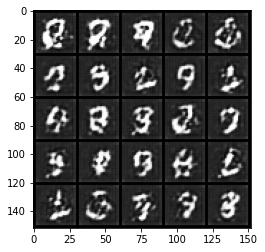

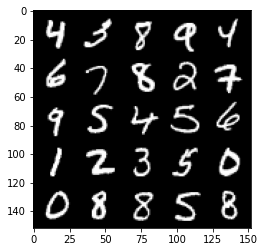

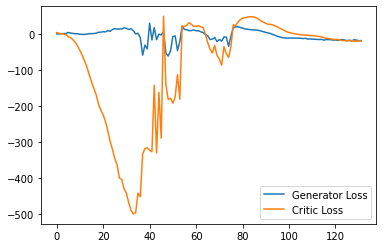

Step 2700: Generator loss: -20.355428256988525, critic loss: -19.50988040542602


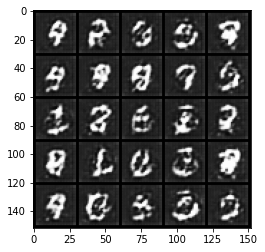

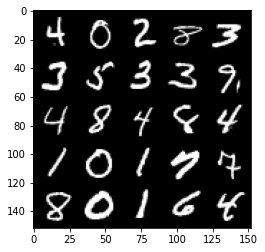

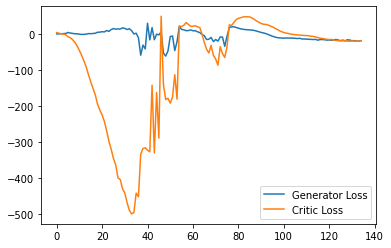

Step 2750: Generator loss: -20.249613447189333, critic loss: -21.670973464965815


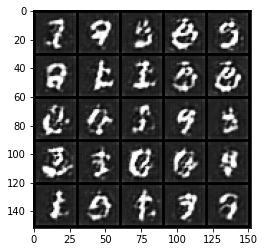

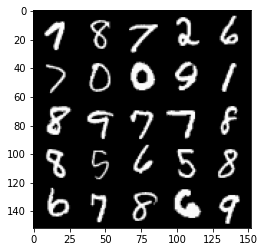

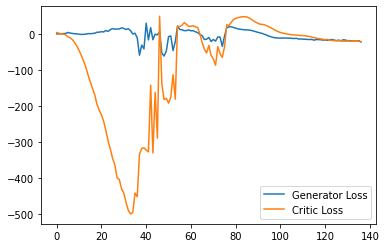

Step 2800: Generator loss: -22.347107467651366, critic loss: -21.497967960357663


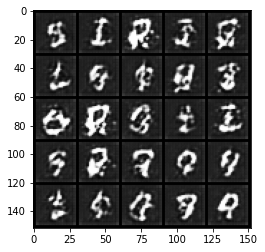

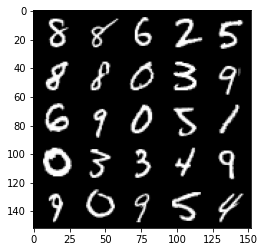

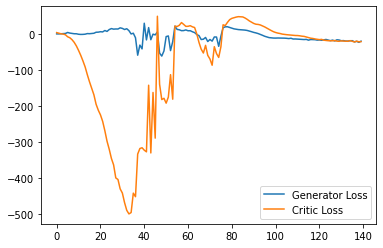

Step 2850: Generator loss: -20.61662773132324, critic loss: -8.439164417266845


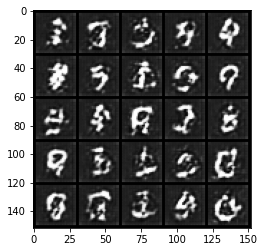

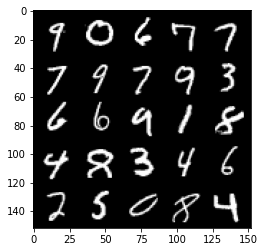

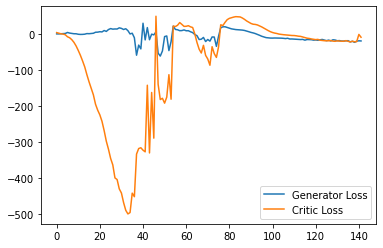

Step 2900: Generator loss: -25.60051229476929, critic loss: -19.301134428024298


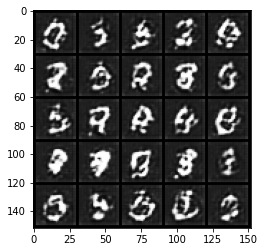

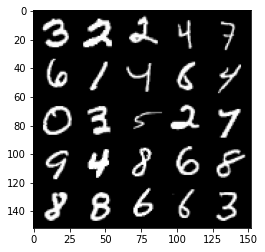

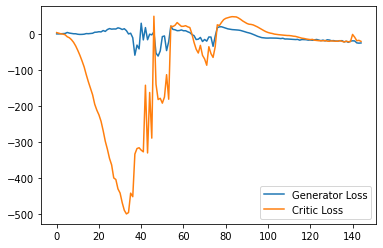

Step 2950: Generator loss: -25.44945846557617, critic loss: -20.402445648193357


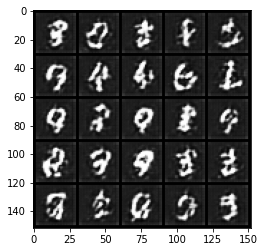

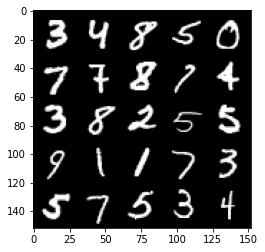

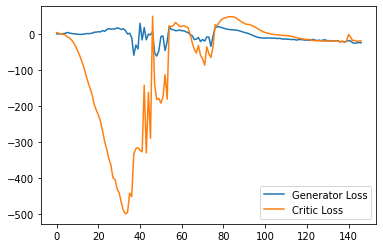

Step 3000: Generator loss: -21.555489807128907, critic loss: -2.360575057983398


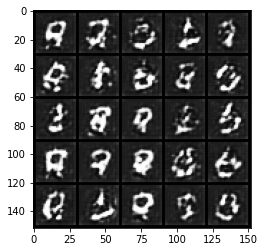

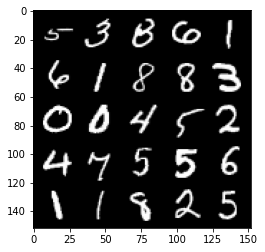

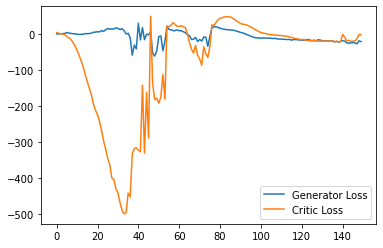

Step 3050: Generator loss: -27.96254081726074, critic loss: -16.347871131896976


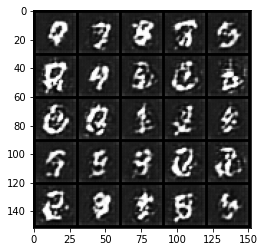

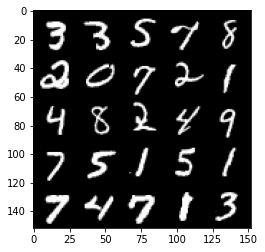

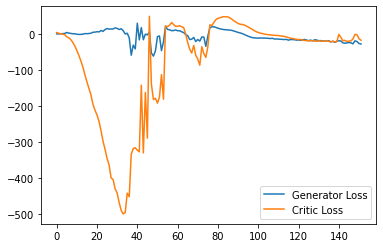

Step 3100: Generator loss: -26.99873020172119, critic loss: -18.431651292800904


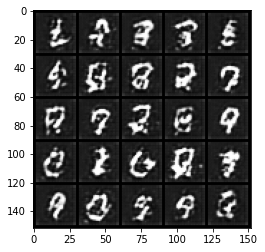

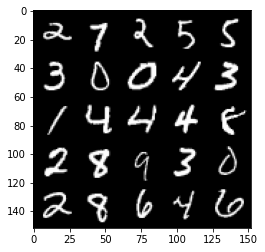

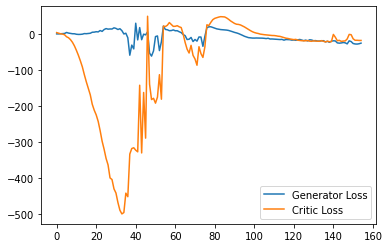

Step 3150: Generator loss: -26.6044575881958, critic loss: -19.60898977279663


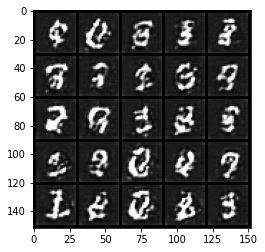

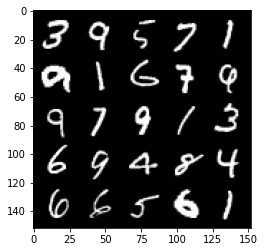

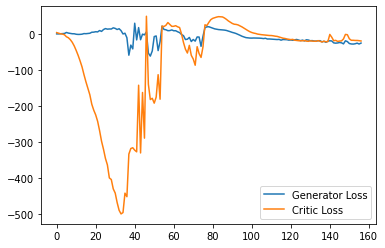

Step 3200: Generator loss: -23.31859426498413, critic loss: -19.457904396057128


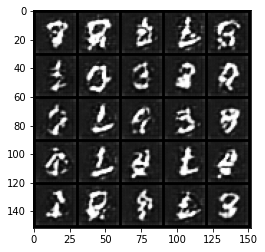

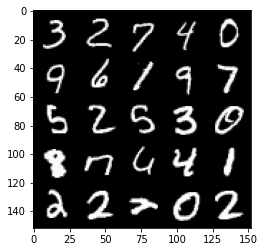

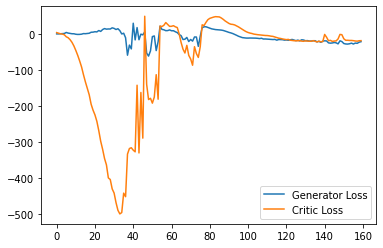

Step 3250: Generator loss: -21.227317180633545, critic loss: -20.258957511901855


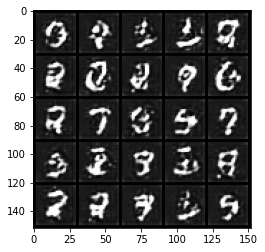

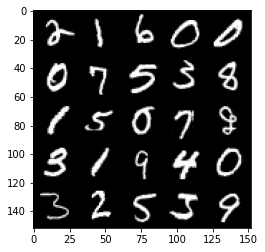

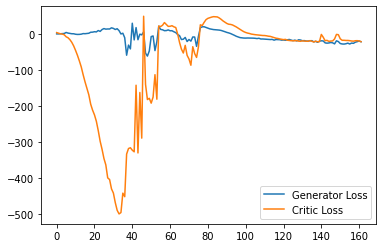

Step 3300: Generator loss: -19.9816548538208, critic loss: -18.509227565765382


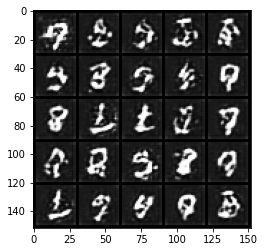

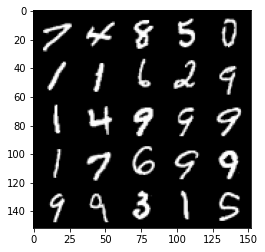

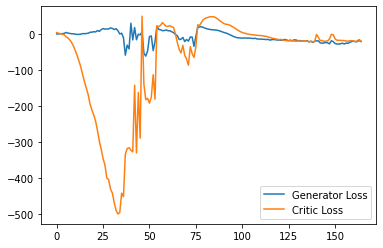

Step 3350: Generator loss: -16.83628578186035, critic loss: -20.121384342193604


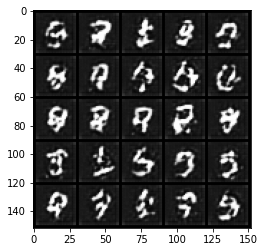

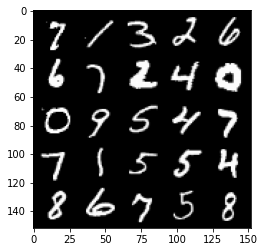

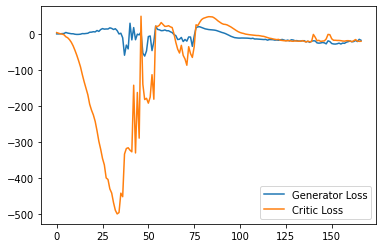

Step 3400: Generator loss: -15.147703831791878, critic loss: -19.954844223022462


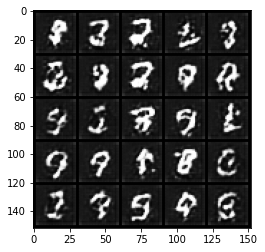

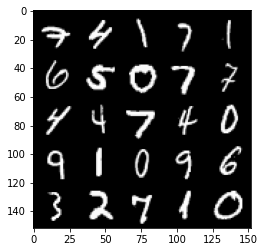

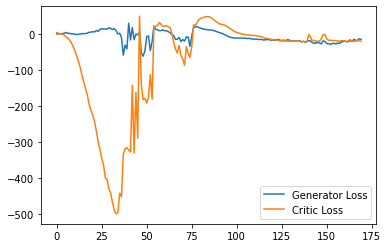

Step 3450: Generator loss: -13.52077112287283, critic loss: -20.70426016616821


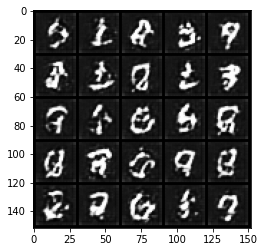

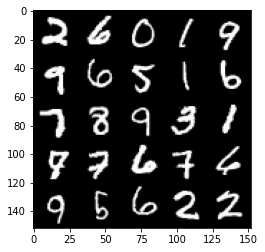

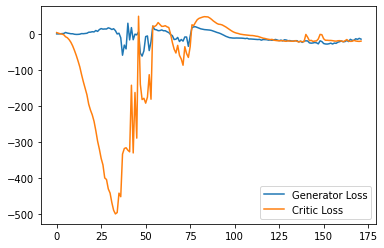

Step 3500: Generator loss: -4.005494122505188, critic loss: -4.208040859222413


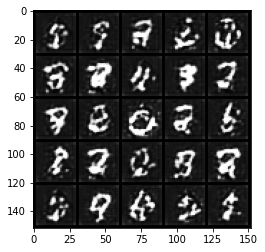

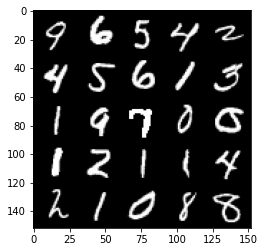

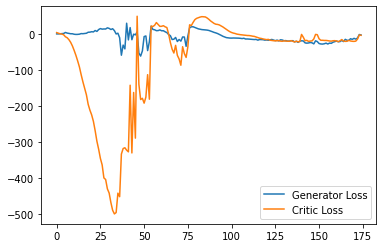

Step 3550: Generator loss: -11.066623182296754, critic loss: -16.230139883041385


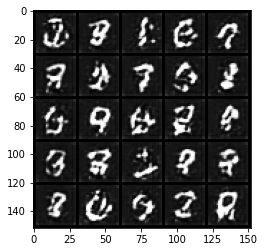

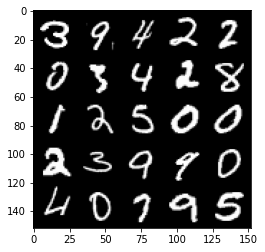

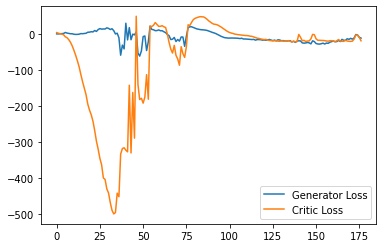

Step 3600: Generator loss: -8.580951502919197, critic loss: -19.68400381660462


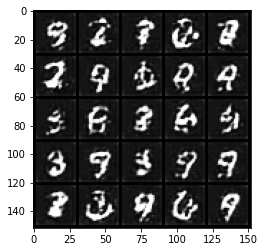

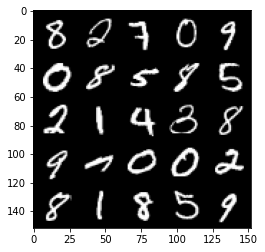

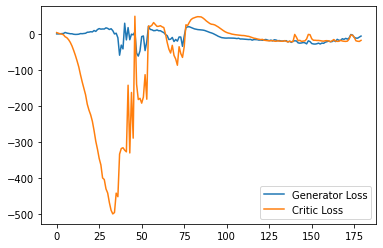

Step 3650: Generator loss: -5.766069945394992, critic loss: -12.843071328163147


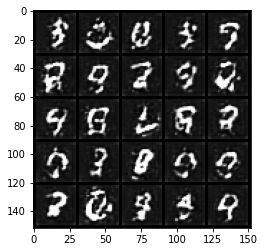

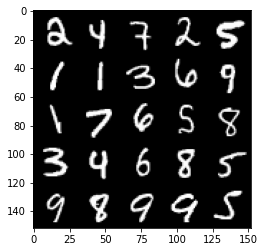

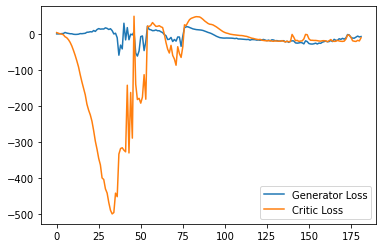

Step 3700: Generator loss: -4.756118347048759, critic loss: -14.72522399139404


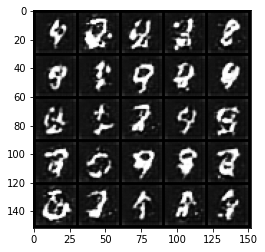

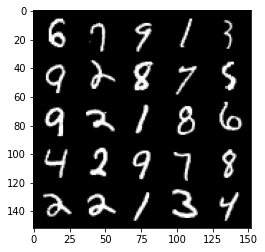

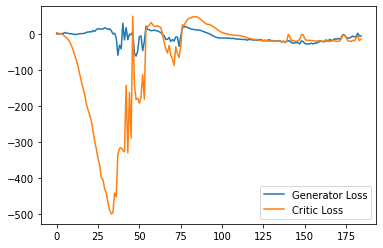

Step 3750: Generator loss: -8.107205008268357, critic loss: -20.14029385471344


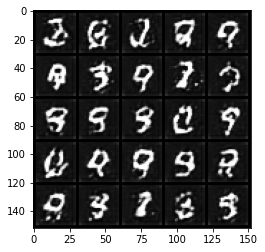

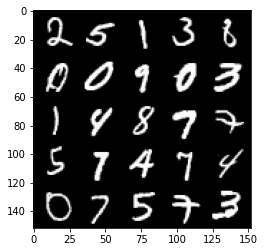

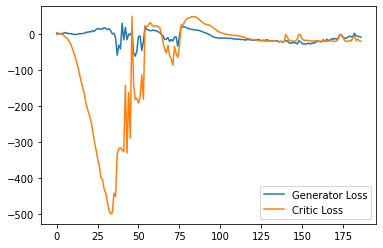

Step 3800: Generator loss: -4.755976899266243, critic loss: -16.717580330848694


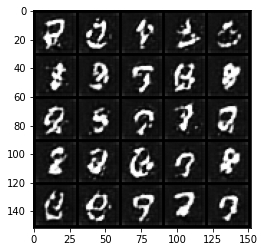

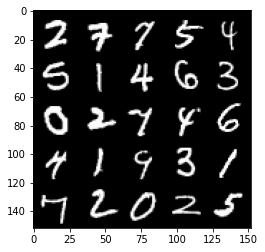

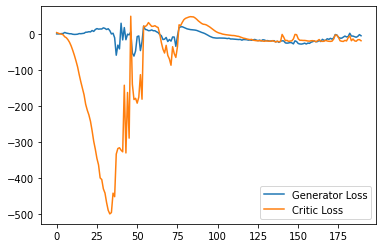

Step 3850: Generator loss: -4.322563764452934, critic loss: -20.004258735656737


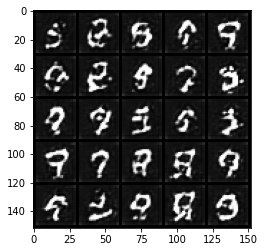

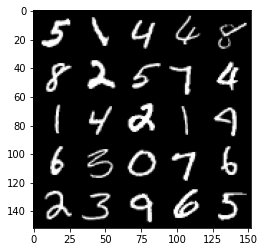

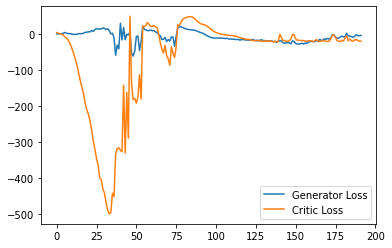

Step 3900: Generator loss: -3.278447610139847, critic loss: -18.110373984336857


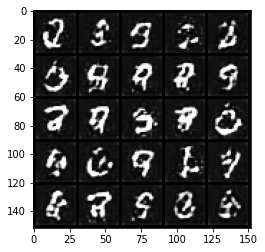

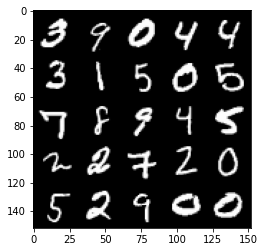

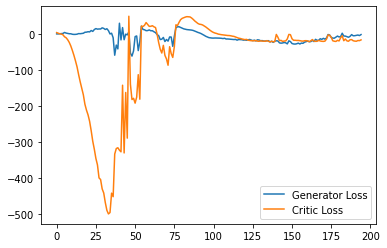

Step 3950: Generator loss: -4.976786994338036, critic loss: -20.183177339553833


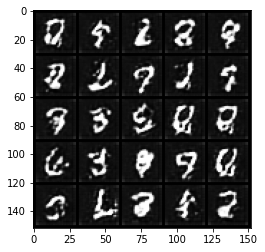

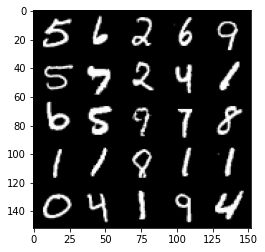

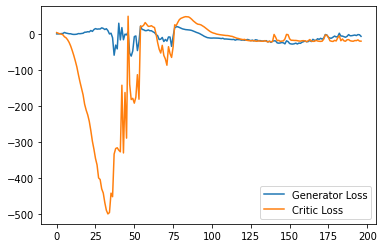

Step 4000: Generator loss: -1.0200303435325622, critic loss: -13.17007219696045


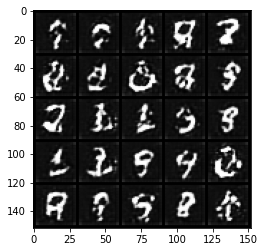

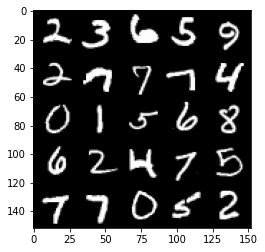

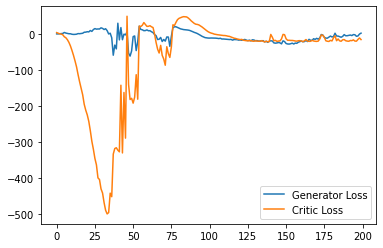

Step 4050: Generator loss: -3.2536553180217744, critic loss: -16.613115970611574


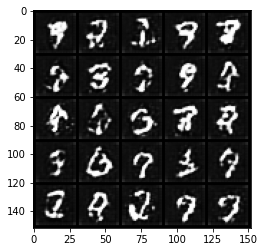

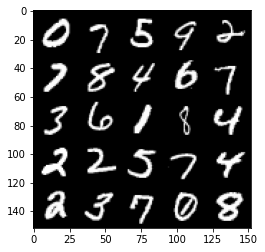

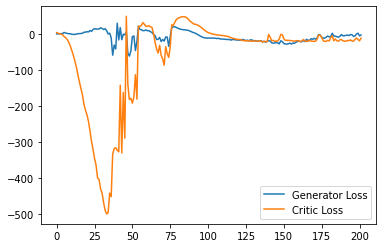

Step 4100: Generator loss: -3.1224473118782043, critic loss: -17.45750787734985


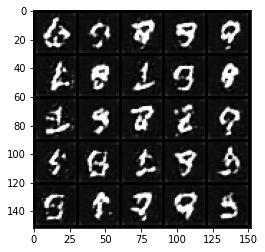

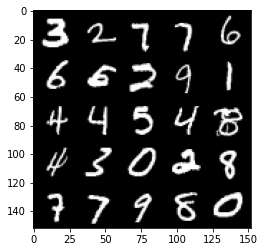

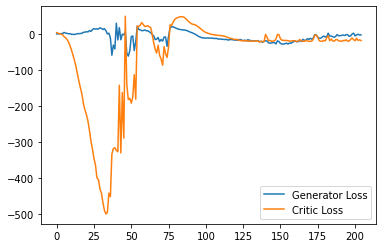

Step 4150: Generator loss: -2.0702898329496384, critic loss: -14.516801851272582


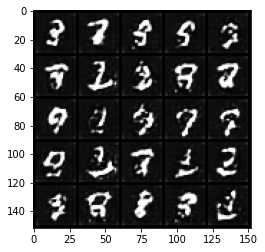

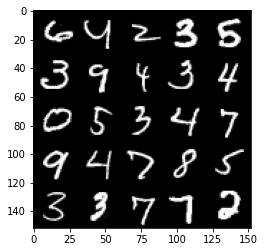

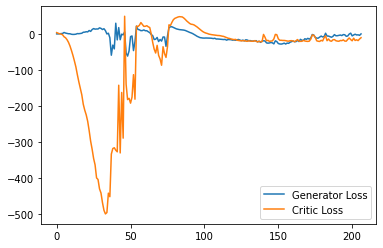

Step 4200: Generator loss: -1.161987869143486, critic loss: -13.428792585372923


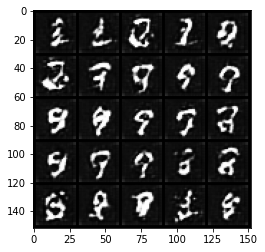

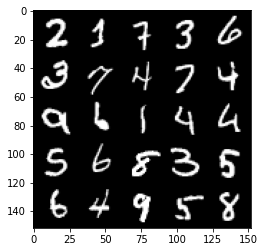

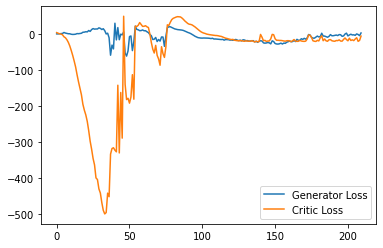

Step 4250: Generator loss: 7.933095626831054, critic loss: -3.167947442531585


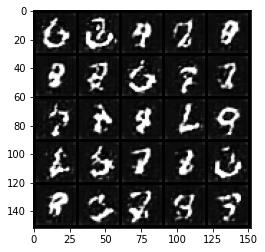

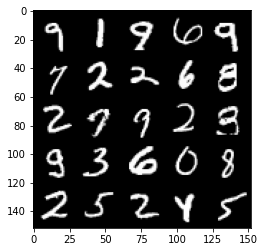

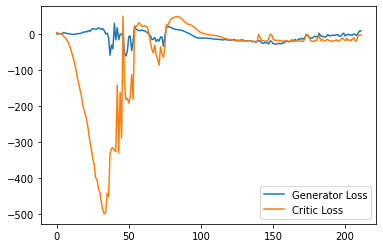

Step 4300: Generator loss: 2.7731089013814927, critic loss: -6.7799539422988895


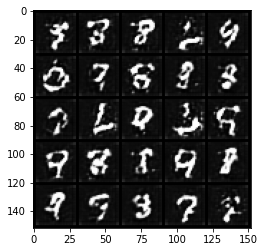

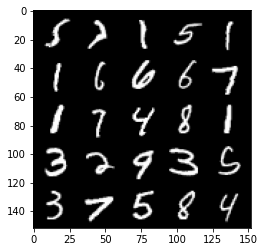

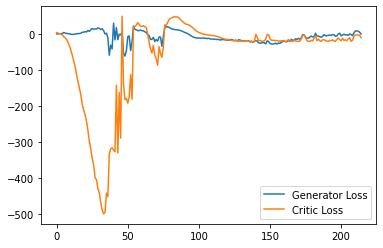

Step 4350: Generator loss: -5.5712021434307095, critic loss: -17.912090478897092


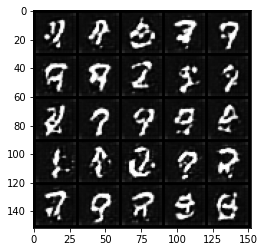

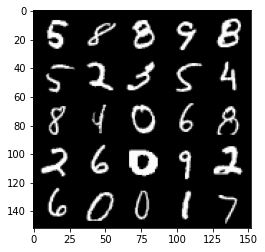

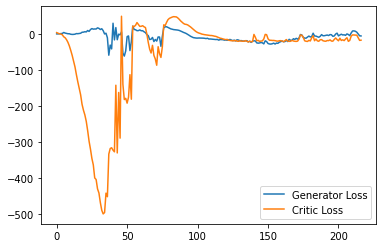

Step 4400: Generator loss: -4.469732616543769, critic loss: -18.176091581344608


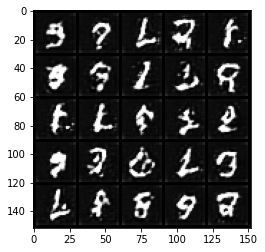

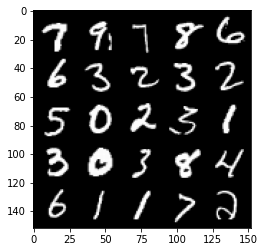

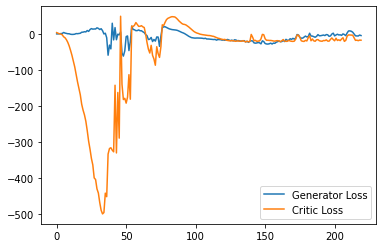

Step 4450: Generator loss: 7.119217367172241, critic loss: 0.20284135866165143


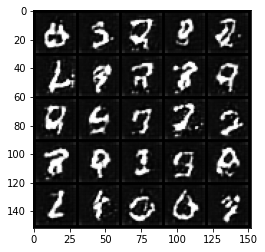

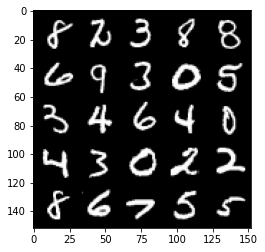

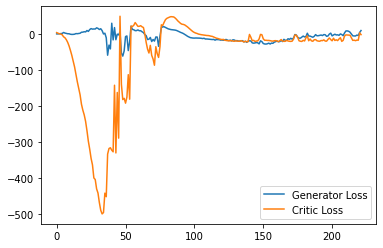

Step 4500: Generator loss: 5.80414852142334, critic loss: -2.1707217259407043


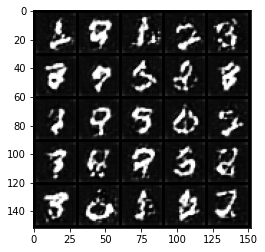

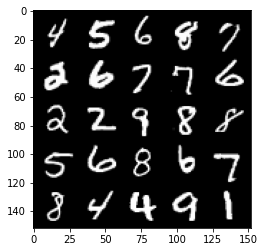

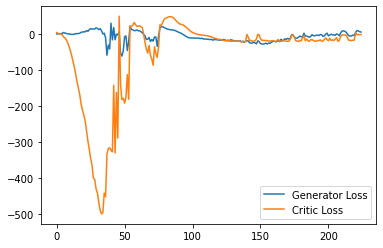

Step 4550: Generator loss: 3.866614751815796, critic loss: -2.499324892997741


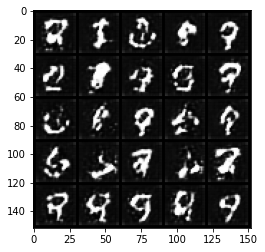

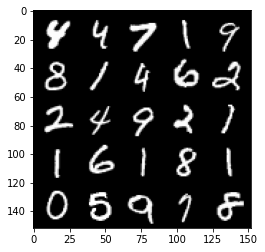

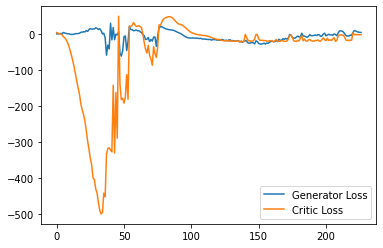

Step 4600: Generator loss: 3.1509183120727537, critic loss: -3.2131310729980465


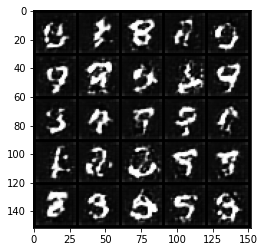

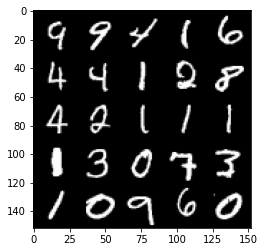

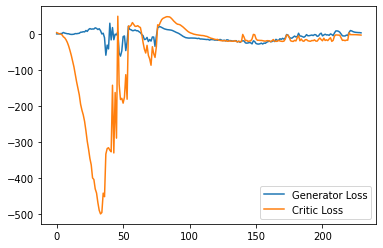

Step 4650: Generator loss: 1.8961545634269714, critic loss: -3.765938431739807


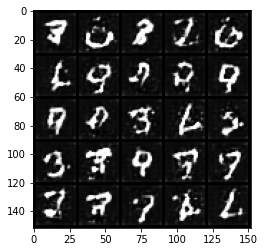

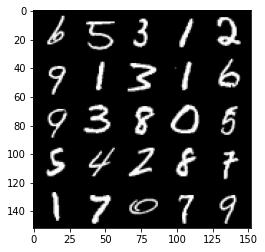

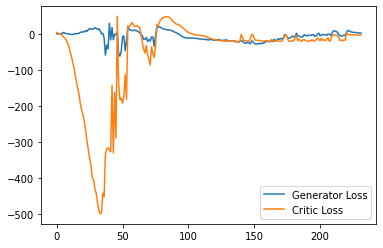

Step 4700: Generator loss: 2.7176768177747728, critic loss: -1.7178532629013068


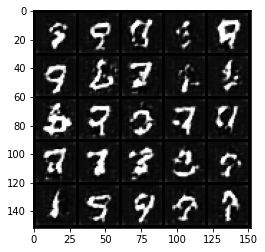

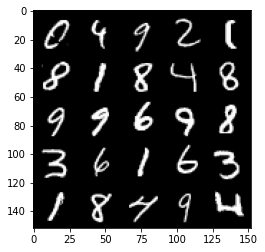

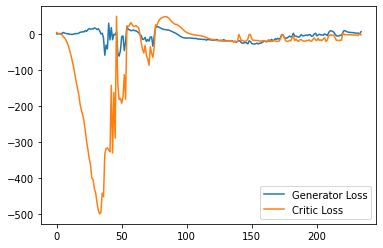

Step 4750: Generator loss: 4.704148049354553, critic loss: -3.7047274303436266


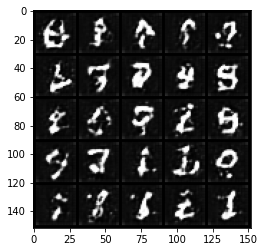

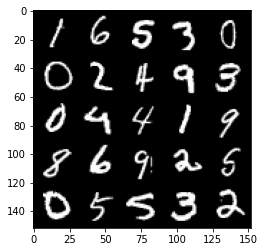

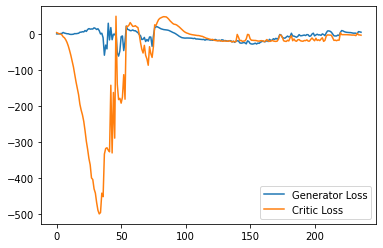

Step 4800: Generator loss: 0.4818840837478638, critic loss: -8.248511024475096


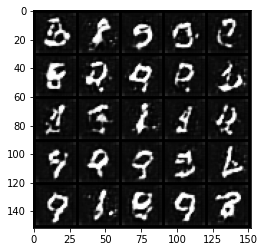

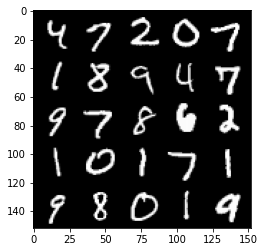

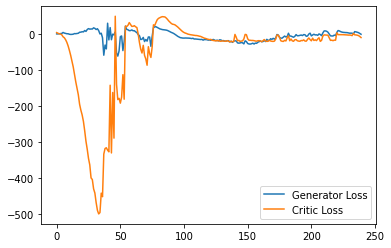

Step 4850: Generator loss: -0.11794682562351227, critic loss: -11.883684469699858


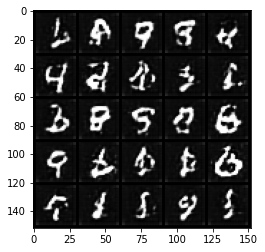

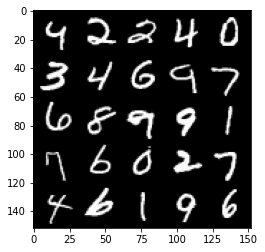

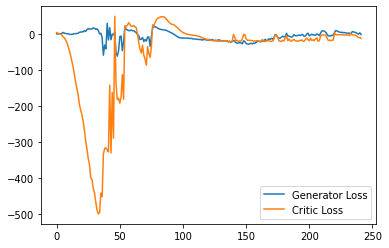

Step 4900: Generator loss: 1.8523859623074532, critic loss: -9.968962462425232


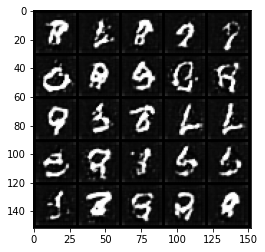

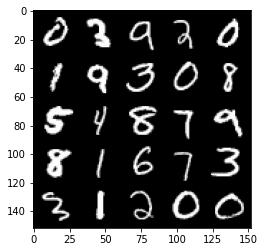

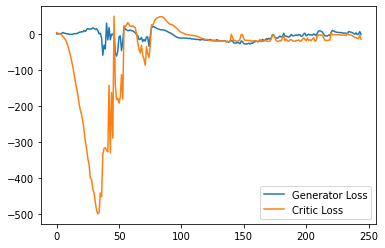

Step 4950: Generator loss: 6.845935935974121, critic loss: -1.8786269359588623


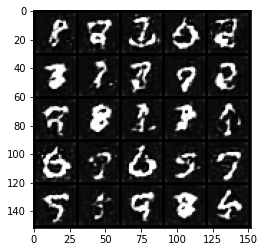

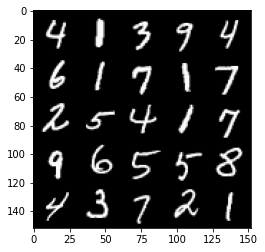

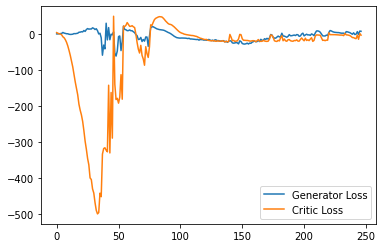

Step 5000: Generator loss: 0.2822537350654602, critic loss: -11.666471055984495


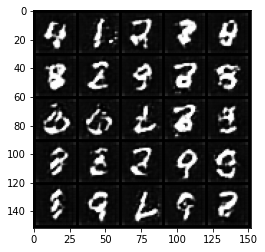

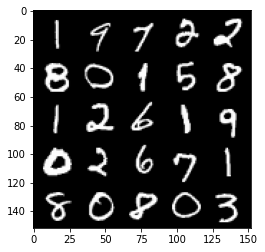

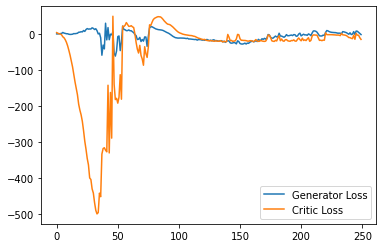

Step 5050: Generator loss: 4.999652280807495, critic loss: -5.903649250030518


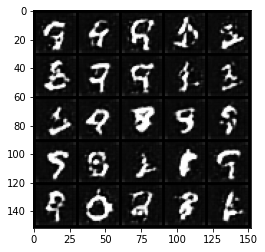

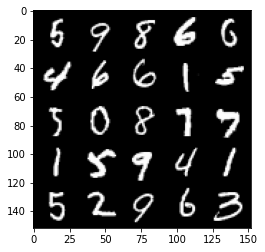

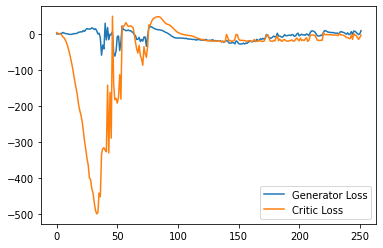

Step 5100: Generator loss: -1.4754432439804077, critic loss: -12.013673349380491


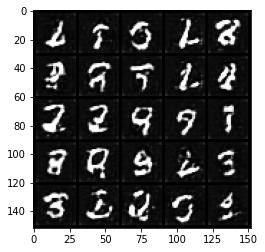

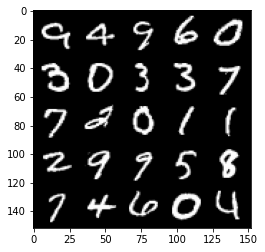

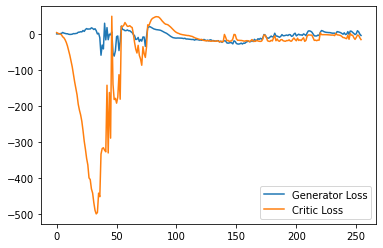

Step 5150: Generator loss: -1.642723407447338, critic loss: -10.573699090480805


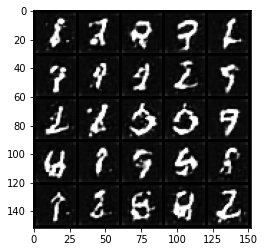

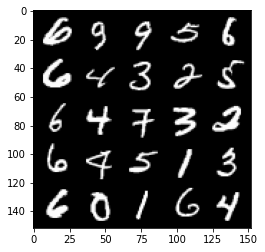

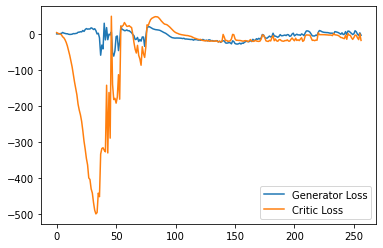

Step 5200: Generator loss: -3.906686545610428, critic loss: -17.14873155784607


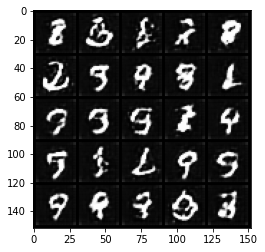

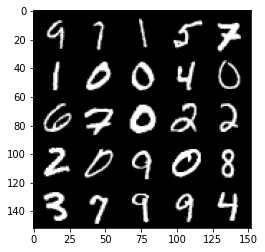

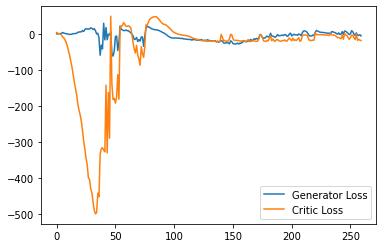

Step 5250: Generator loss: -2.5887415087223054, critic loss: -15.365844602108002


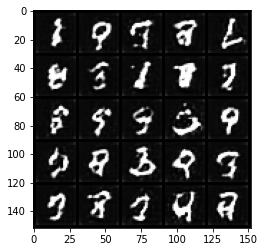

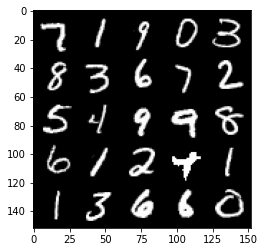

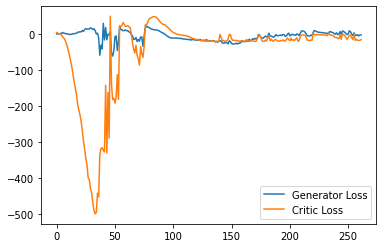

Step 5300: Generator loss: 2.8448351348936556, critic loss: -5.133409613609314


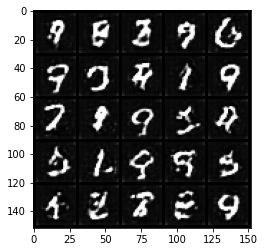

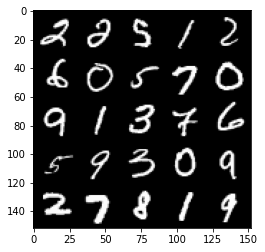

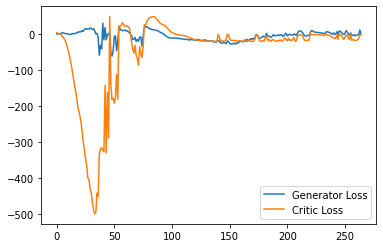

Step 5350: Generator loss: -0.6114668136835099, critic loss: -14.992881694316864


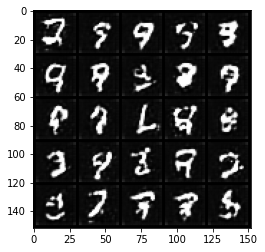

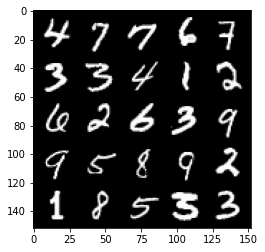

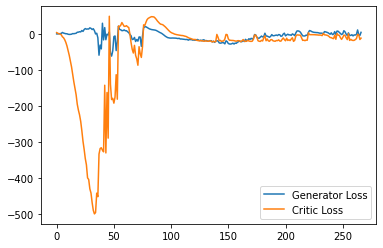

Step 5400: Generator loss: 4.934759560823441, critic loss: -2.983105285644531


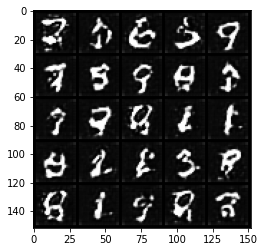

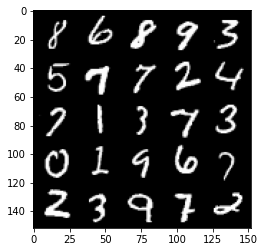

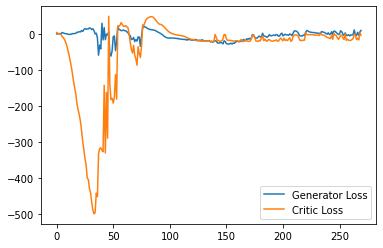

Step 5450: Generator loss: 3.268194971084595, critic loss: -9.077003350257874


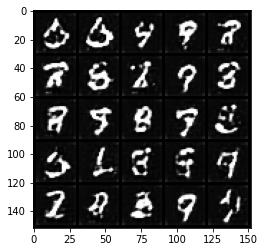

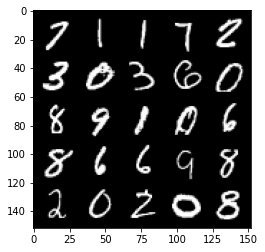

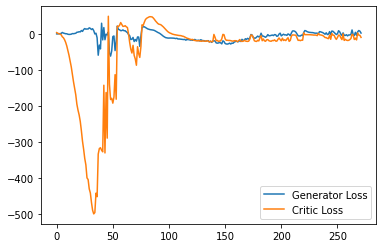

Step 5500: Generator loss: 1.8457675704360008, critic loss: -11.949113387584685


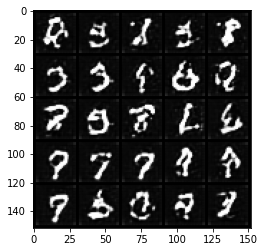

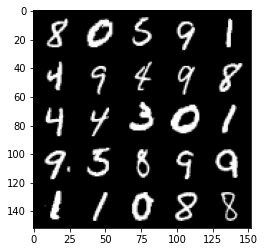

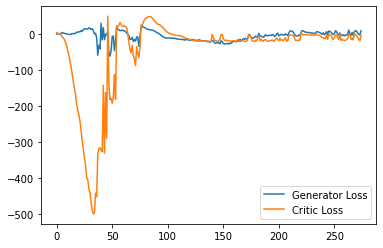

Step 5550: Generator loss: -1.3982351693511008, critic loss: -14.957185132026668


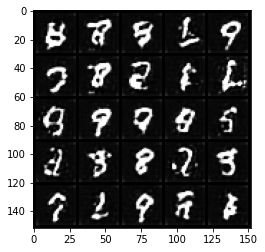

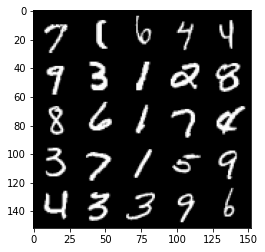

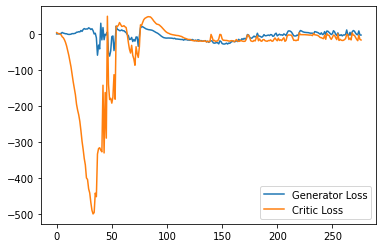

Step 5600: Generator loss: -1.096850281059742, critic loss: -15.623767484664917


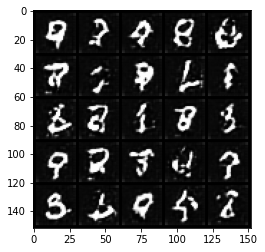

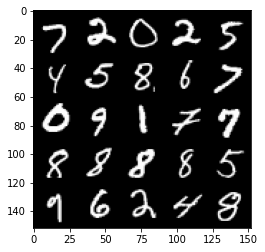

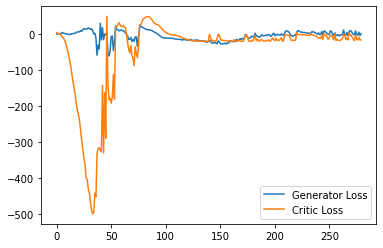

Step 5650: Generator loss: -2.344256764650345, critic loss: -16.016724016189574


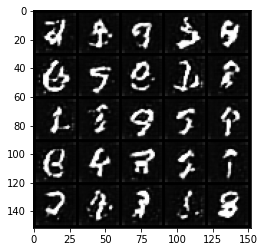

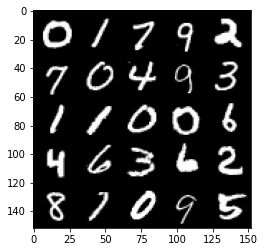

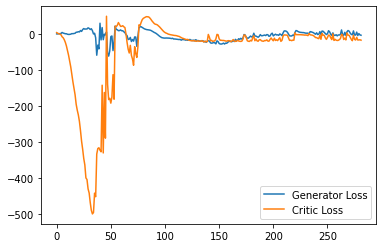

Step 5700: Generator loss: -3.713727150708437, critic loss: -17.532388259410858


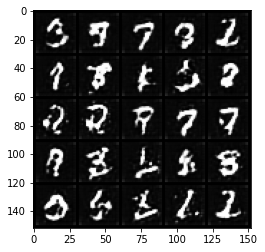

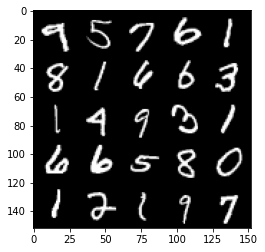

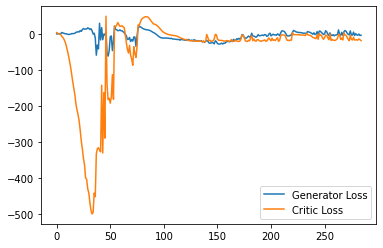

Step 5750: Generator loss: -0.38512576460838316, critic loss: -15.80025617027283


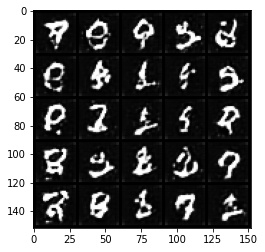

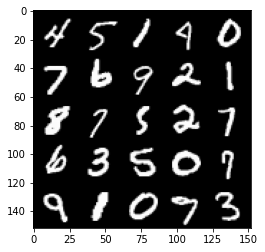

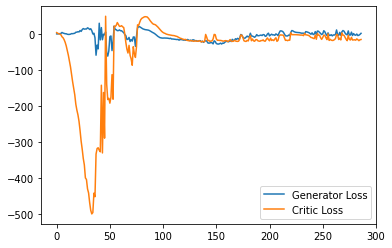

Step 5800: Generator loss: -2.362755700945854, critic loss: -18.822553757667542


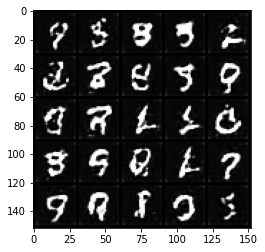

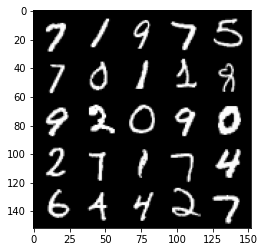

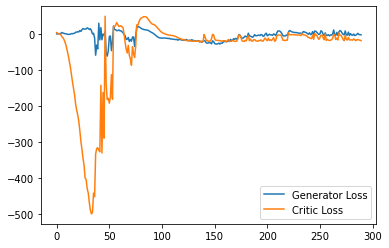

Step 5850: Generator loss: 3.3743342995643615, critic loss: -5.519667460918425


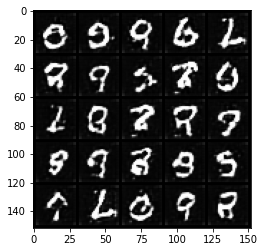

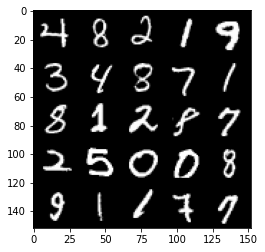

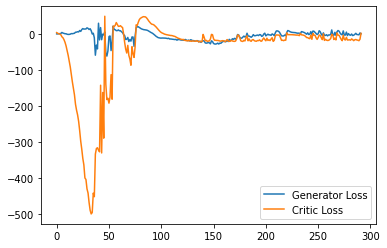

Step 5900: Generator loss: 6.403453938961029, critic loss: -3.918455844879149


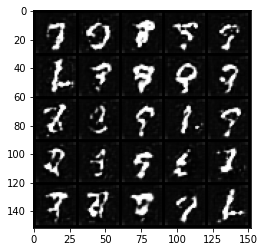

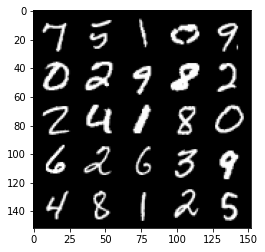

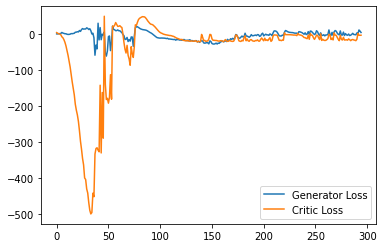

Step 5950: Generator loss: 2.3896540009975435, critic loss: -4.194491979122161


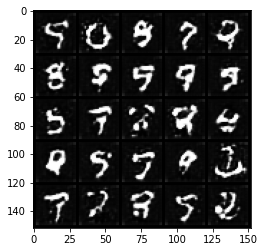

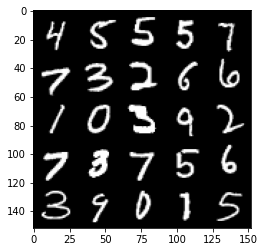

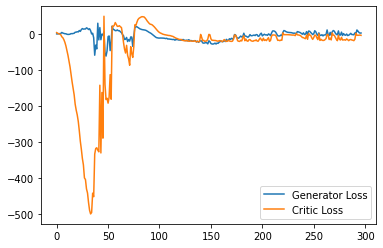

Step 6000: Generator loss: -6.065795256495476, critic loss: -16.809001321792604


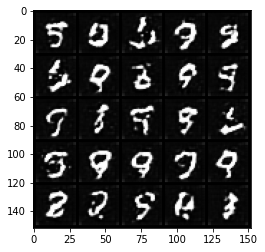

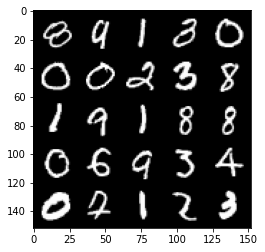

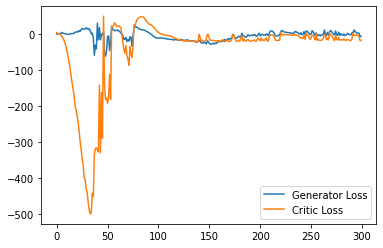

Step 6050: Generator loss: -1.1969512033462524, critic loss: -13.226910709381107


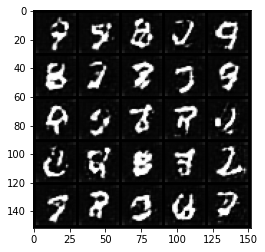

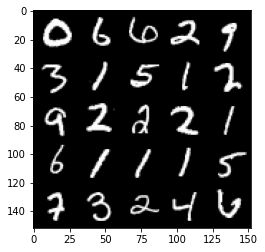

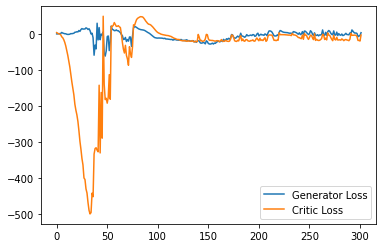

Step 6100: Generator loss: 0.5812672042846679, critic loss: -11.231668867111203


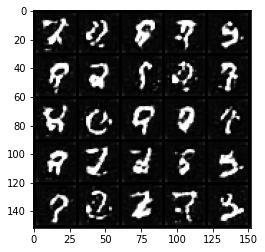

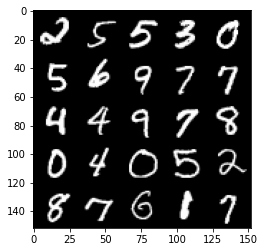

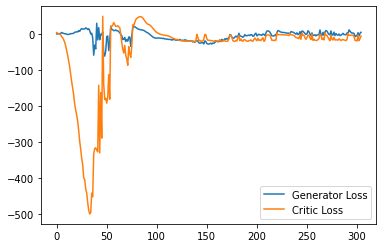

Step 6150: Generator loss: -2.69938143953681, critic loss: -14.849151172637942


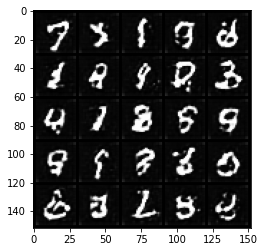

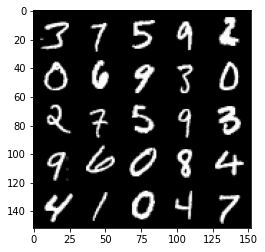

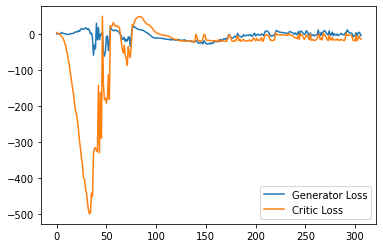

Step 6200: Generator loss: 1.9604695492982864, critic loss: -13.658813572883606


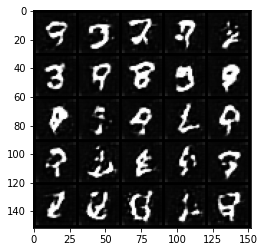

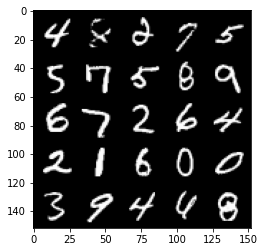

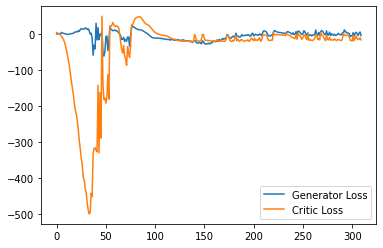

Step 6250: Generator loss: -3.826357527971268, critic loss: -13.586487839221954


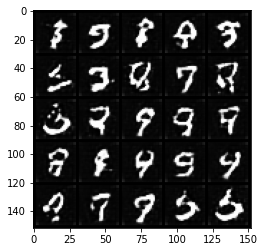

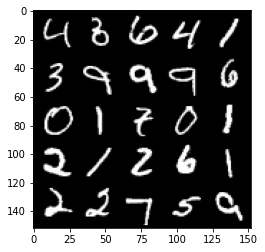

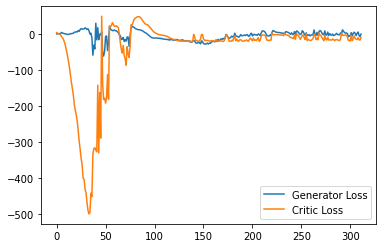

Step 6300: Generator loss: -3.3132865738868715, critic loss: -15.21793308854103


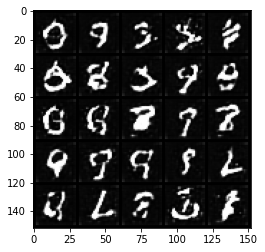

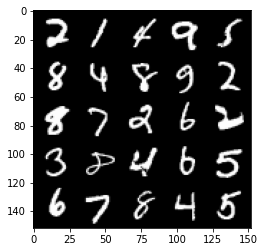

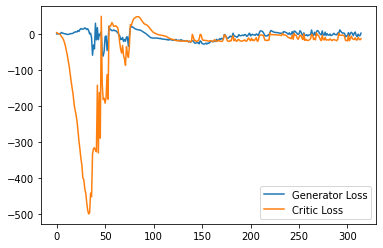

Step 6350: Generator loss: -2.83494203209877, critic loss: -17.164827484607702


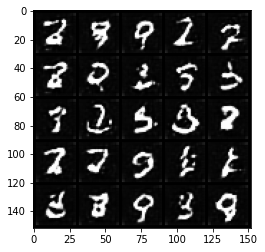

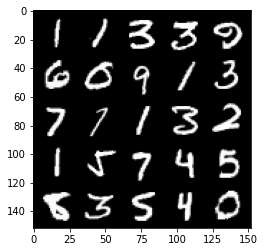

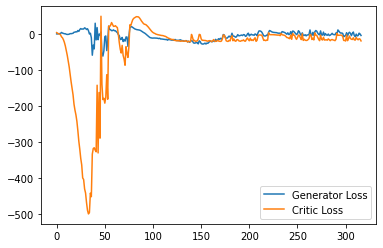

Step 6400: Generator loss: -1.1410071793198586, critic loss: -14.277558126449584


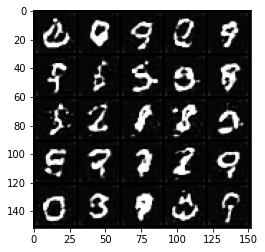

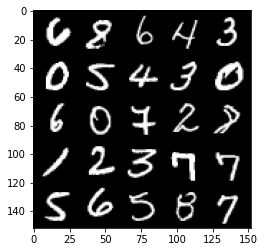

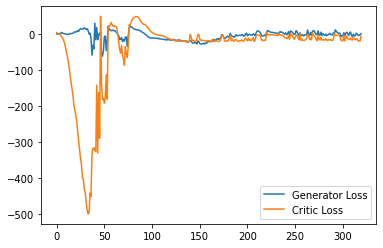

Step 6450: Generator loss: 2.6454158556461334, critic loss: -7.963281742572784


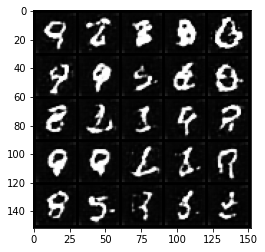

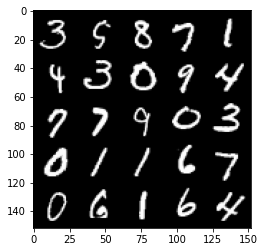

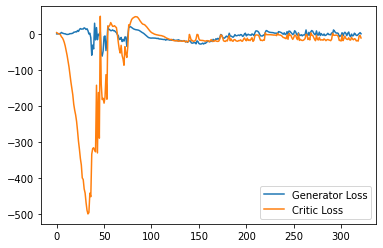

Step 6500: Generator loss: -3.5039097025990484, critic loss: -13.09641722154617


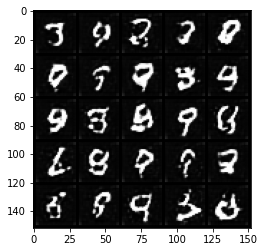

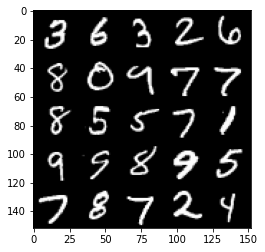

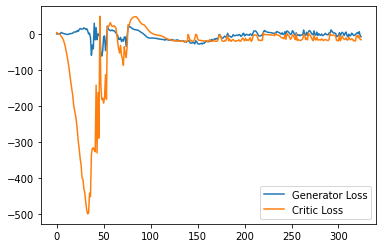

Step 6550: Generator loss: -0.47680332958698274, critic loss: -15.734696118831641


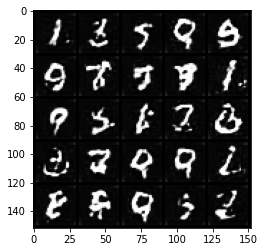

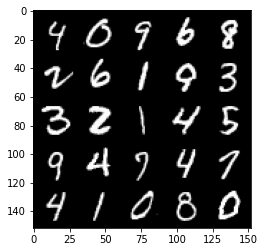

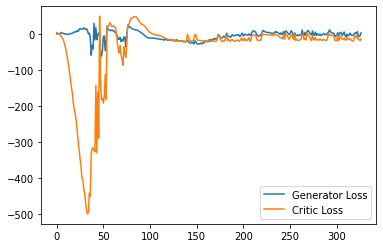

Step 6600: Generator loss: -1.694701156616211, critic loss: -15.953744792461398


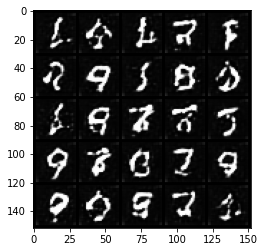

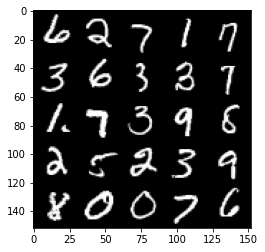

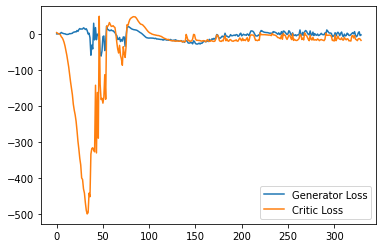

Step 6650: Generator loss: 0.06846340030431747, critic loss: -16.48175568532944


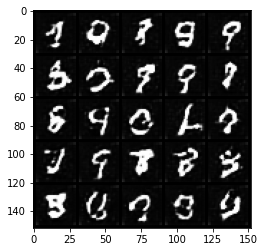

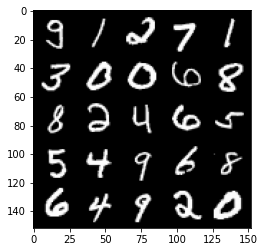

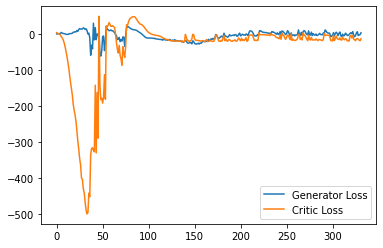

Step 6700: Generator loss: -2.6360893738269806, critic loss: -17.406290828704833


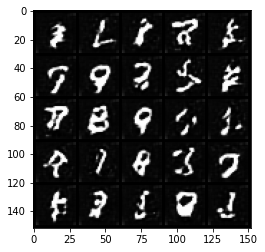

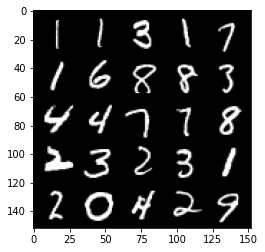

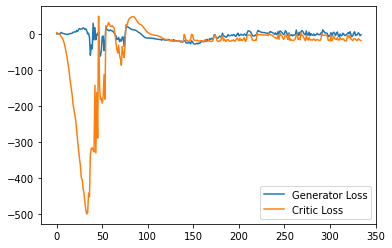

Step 6750: Generator loss: 3.65637531042099, critic loss: -3.1168320980072


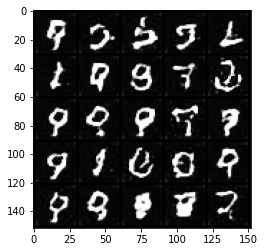

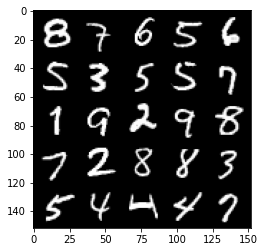

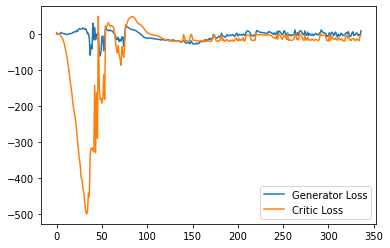

Step 6800: Generator loss: 0.00016290605068206788, critic loss: -7.710146018981933


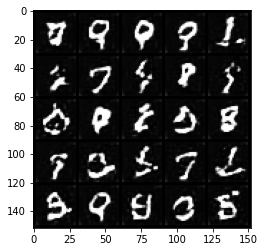

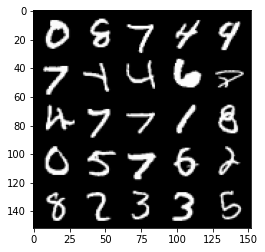

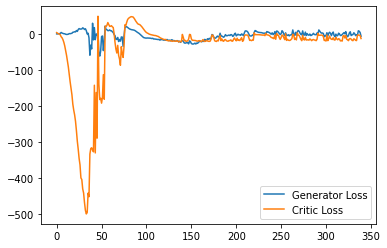

Step 6850: Generator loss: 0.3401034700870514, critic loss: -16.254339935779573


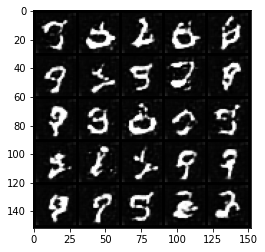

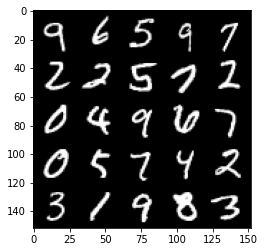

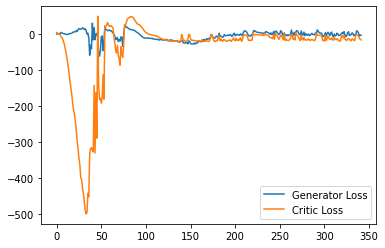

Step 6900: Generator loss: -0.483780226111412, critic loss: -9.708660771846773


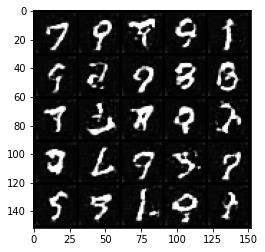

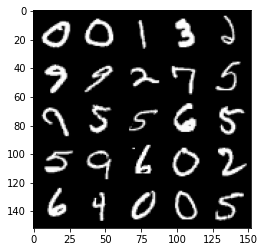

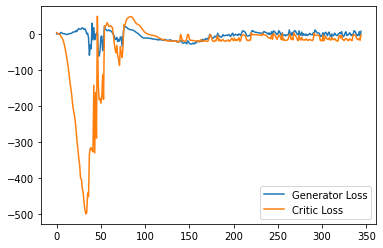

Step 6950: Generator loss: 0.8619544494152069, critic loss: -7.81969170999527


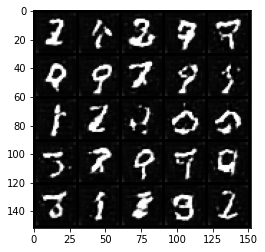

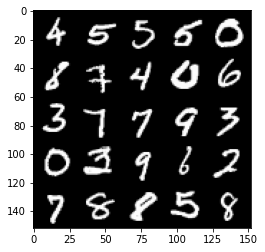

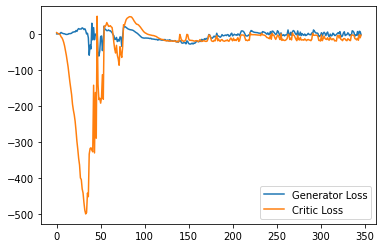

Step 7000: Generator loss: -1.8423038172721862, critic loss: -19.665839290380482


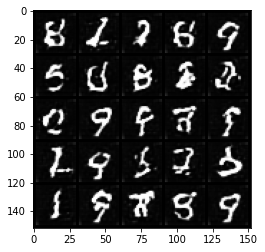

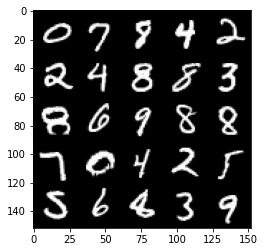

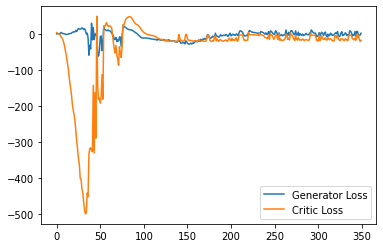

Step 7050: Generator loss: 0.36560046195983886, critic loss: -12.83527222204208


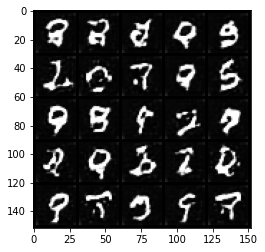

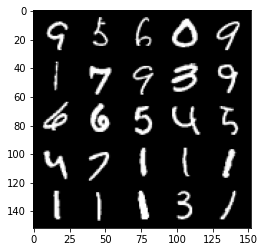

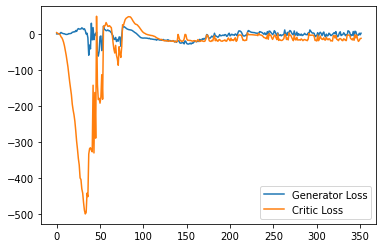

KeyboardInterrupt: 

In [45]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
